# Preliminaries

## Libraries

In [1]:
# This cell needs to be run twice, so the plots will display

import time
import itertools
from itertools import cycle
from statistics import mean
import pickle

# Data Handling
import pandas as pd
import numpy as np
from scipy import linalg

from sklearn.preprocessing import scale, StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer

# Dimensionality Reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Clustering
from sklearn.cluster import KMeans, MiniBatchKMeans, SpectralClustering, AgglomerativeClustering, Birch
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# Evaluation
from pyclustertend import hopkins, vat, ivat
from yellowbrick.cluster import KElbowVisualizer
from kneed import KneeLocator
import gapstat_rs
from gap_statistic import OptimalK
from sklearn import metrics
from sklearn.metrics import silhouette_score
from amltlearn.metrics.cluster import calinski_harabasz_score, davies_bouldin_score

# Visualization
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib import animation
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D
import mpl_toolkits.mplot3d.axes3d as p3
import seaborn as sns
from pylab import *
import plotly
import plotly.express as px
import plotly.graph_objs as go

%matplotlib inline 
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

/Users/nathanasmooha/.pyenv/versions/3.7.8/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/Users/nathanasmooha/.pyenv/versions/3.7.8/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.cluster.supervised module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics.cluster. Anything that cannot be imported from sklearn.metrics.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)


## Functions

In [2]:
def plot_corr(df):
    corr = df.corr()
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize=(11, 9))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [2]:
def plot_internal_validity(max_clusters, internal_measure, name):
    fig = plt.figure(figsize=(20,10))
    plt.style.use("fivethirtyeight")
    plt.plot(range(2, max_clusters+1), internal_measure)
    
    for x,y in zip(range(2, max_clusters+1), internal_measure):
        
        label = "{:.2f}".format(y)
        plt.annotate(label, (x,y), textcoords="offset points", xytext=(0,10), ha="center")
    
    plt.xticks(range(2, max_clusters+1))
    plt.xlabel("Number of Clusters")
    plt.ylabel(name)
    plt.show()

In [3]:
def prepare_tsne(data, n_components, labels):
    matrix = data
    
    names = ['x', 'y', 'z']
    df_matrix = pd.DataFrame(matrix)
    df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
    df_matrix['labels'] = labels
    
    return df_matrix

In [4]:
def prepare_pca(data, n_components, labels):
    matrix = PCA(n_components=n_components, svd_solver='full').fit_transform(data)
    
    names = ['x', 'y', 'z']
    df_matrix = pd.DataFrame(matrix)
    df_matrix.rename({i:names[i] for i in range(n_components)}, axis=1, inplace=True)
    df_matrix['labels'] = labels
    
    return df_matrix

In [5]:
def plot_2d(df, model, centers=False):
    fig = plt.figure(figsize=(10, 10))
    plt.style.use("fivethirtyeight")
    ax = fig.add_subplot(111)
    plt.scatter(df['x'], df['y'], c=df["labels"], s=15, cmap='Paired')
    
    if centers:
        plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:, 1], c='r', s=500, alpha=0.7, )
    
    plt.grid(True)
    plt.show()

In [6]:
def plot_3d(df):
    def update(num):
        ax.view_init(200, num)

    N=360
    fig = plt.figure(figsize=(10,10))
    plt.style.use("fivethirtyeight")
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(df['x'], df['y'], df['z'], c=df["labels"],
               s=6, depthshade=True, cmap='Paired')
    ax.set_zlim(-15, 25)
    ax.set_xlim(-20, 20)
    plt.tight_layout()
    ani = animation.FuncAnimation(fig, update, N, blit=False, interval=50)
    plt.show()

In [7]:
def plot_model_results(internal_measure, name):
    fig = plt.figure(figsize=(20,10))
    plt.style.use("fivethirtyeight")
    
    ax = fig.add_axes([0,0,1,1])
    ax.set_ylabel(name)
    ax.set_xlabel("Clustering Method")
    
    title = "Model Results: " + name
    ax.set_title(title)
    ax.bar(model_names, internal_measure)
    
    for x,y in zip(model_names, internal_measure):
        label = "{:.2f}".format(y)
        plt.annotate(label, (x,y), textcoords="offset points", xytext=(0,10), ha="center")
    
    plt.show()

# Cluster Tendency

Sources

https://pypi.org/project/pyclustertend/

https://pyclustertend.readthedocs.io/en/latest/

https://www.kaggle.com/lachhebo/hopkins-test

Before applying any clustering method on the data, it’s important to evaluate whether the data sets contains meaningful clusters (i.e.: non-random structures) or not. This process is defined as the assessing of clustering tendency or the feasibility of the clustering analysis.

## Preprocess Data

In [8]:
# Load the raw Census and Amenities data
df_viz = pd.read_pickle(r'../data/features/Final_Visualization_Input_Data.pkl')

In [9]:
# Only retain the columns that will be utilized in the clustering models
column_list = ['GEOID', 'GEO_ID', 'NAME', 'SUM_IND_Child_Dep_Ratio',
       'SUM_IND_Old_Age_Dep_Ratio', 'SUM_IND_Med_Age', 'MED_INC_25_PLUS_Tot',
       'PERC_BEL_POV', 'LAB_FRC_POP_20_to_64', 'UNEMP_RATE_POP_20_to_64',
       'HH_FAM_Avg_Fam_Size', 'HH_TOT_1_Unit_Stuct',
       'HH_TOT_2_Plus_Unit_Struct', 'HH_TOT_Owner', 'RACE_One_Race_White',
       'RACE_One_Race_Black', 'RACE_One_Race_Asian',
       'RACE_One_Race_Hawaiian_PacIsl', 'RACE_One_Race_Other', 'RACE_Tot_Hisp',
       'HOUSE_Tot_House_Units', 'EDU_25_PLUS_w_HS_or_GED',
       'EDU_25_PLUS_w_Bachelors_Plus',
       'CIV_EMP_POP_16_PLUS_GRP_Mngmt_Bus_Sci_Art',
       'CIV_EMP_POP_16_PLUS_GRP_Srv', 'CIV_EMP_POP_16_PLUS_GRP_Sls_Office',
       'CIV_EMP_POP_16_PLUS_GRP_NatRes_Constr_Maint',
       'CIV_EMP_POP_16_PLUS_GRP_Prod_Trans_MatMov', 'WT_N_GROCERY_DIST_25',
       'WT_N_GYMS_DIST_25', 'WT_N_HARDWARE_DIST_25', 'WT_N_PARKS_DIST_25',
       'WT_N_MEDICAL_DIST_25']

df_viz = df_viz[column_list]

In [10]:
# Retrieve the data values from the feature columns and scale the data

df_temp = df_viz[df_viz.columns[~df_viz.columns.isin(["GEOID","GEO_ID","NAME"])]].copy()
df_temp.dropna(axis=0, how="any", inplace=True)

X_raw = df_temp.values
X_scale = scale(X_raw)

## Hopkins Test

The Hopkins statistic is used to assess the clustering tendency of a data set by measuring the probability that a given data set is generated by a uniform data distribution. In other words, it tests the spatial randomness of the data.

Three different results are possible: 1) H = 0.5: the dataset reveals no clustering structure in the formula; 2) H close to 0, a significant evidence that the data might be cluster-able; 3) H is close to 1, in this case the test is indecisive (data are neither clustered nor random)

### Hopkins Test on Full Dataset

In [12]:
hopkins(X_scale, X_scale.shape[0])

0.008555634844098334

### Hopkins Test on Data Subsets

In [13]:
# The Hopkins Test is computationally expensive, especially on large datasets
# So, we will create four equally sized dataframes by randomly separating the rows
# Then, we'll run the Hopkins Test on each of these data subsets, and average the results
# We will run this sequence a total of K times to get the best estimate of the dataset's "cluster tendency"

# The number of iterations that will be run
K = 10

# Create a dictionary to store the results of each iteration
hopkins_test_results = {}

for k in range(K):
    # Store the results of the kth iteration in a list
    hopkins_test_results[k] = []
    
    # Randomly separate the original dataframe into four equally sized dataframe subsets
    df_dict = {}
    df_i = df_viz[df_viz.columns[~df_viz.columns.isin(["GEO_ID","NAME"])]].copy()

    for i in range(4):
        if i < 3:
            # Create a dataframe subset and store it in the appropriate dictionary
            df_sample = df_i.sample(n=int(df_viz.shape[0]/4), axis=0).reset_index(drop=True)
            df_dict[i] = df_sample
            
            # Remove the selected rows from the primary dataframe, so they aren't selected again
            a = df_sample['GEOID'].values
            df_i = df_i[~df_i['GEOID'].isin(a)]
        else:
            # If it's the last iteration, simply retain the remaining dataframe subset
            df_dict[i] = df_i
    
    # For each dataframe subset, run the Hopkins Test and store the results in the appropriate list
    for i in df_dict.keys():
        # Retrieve the dataframe subset and drop any null values
        df_i = df_dict[i]
        df_i.dropna(axis=1, how='any', inplace=True)
        
        # Retrieve the data values and scale the data
        X_raw_i = df_i[df_i.columns[~df_i.columns.isin(["GEOID"])]].values
        X_scale_i = scale(X_raw_i)
        
        # Calculate the Hopkins Statistic and store the results
        results = hopkins(X_scale_i, X_scale_i.shape[0])
        hopkins_test_results[k].append(results)

In [14]:
# Loop through the "results" dictionary and take the average of the Hopkins Statistic for each iteration

for k in hopkins_test_results.keys():
    string = "The average Hopkins Statistic of the {} iteration: {}".format(k, mean(hopkins_test_results[k]))
    print(string)

The average Hopkins Statistic of the 0 iteration: 0.008632334690449373
The average Hopkins Statistic of the 1 iteration: 0.0086458192611794
The average Hopkins Statistic of the 2 iteration: 0.008629621295677722
The average Hopkins Statistic of the 3 iteration: 0.008650618120163184
The average Hopkins Statistic of the 4 iteration: 0.008660621126435468
The average Hopkins Statistic of the 5 iteration: 0.008647270194429924
The average Hopkins Statistic of the 6 iteration: 0.008630238414767562
The average Hopkins Statistic of the 7 iteration: 0.008655827903281833
The average Hopkins Statistic of the 8 iteration: 0.008659970592003319
The average Hopkins Statistic of the 9 iteration: 0.008622632272735374


# Exploratory Data Analysis

Sources

https://www.geeksforgeeks.org/multidimensional-data-analysis-in-python/

## Load Data

In [12]:
# Load the cleaned and scaled Census and Amenities data
df_model = pd.read_pickle(r'../data/features/Final_Clustering_Input_Data.pkl')

In [13]:
# Take a subset of the data (used for development/testing)
#df_model = df_model.sample(n=int(df_model.shape[0]/4), axis=0).reset_index(drop=True)

# Gather all the values from the feature columns of the dataframe
X = df_model[df_model.columns[~df_model.columns.isin(["GEOID","GEO_ID","NAME"])]].values

## Correlation Matrix

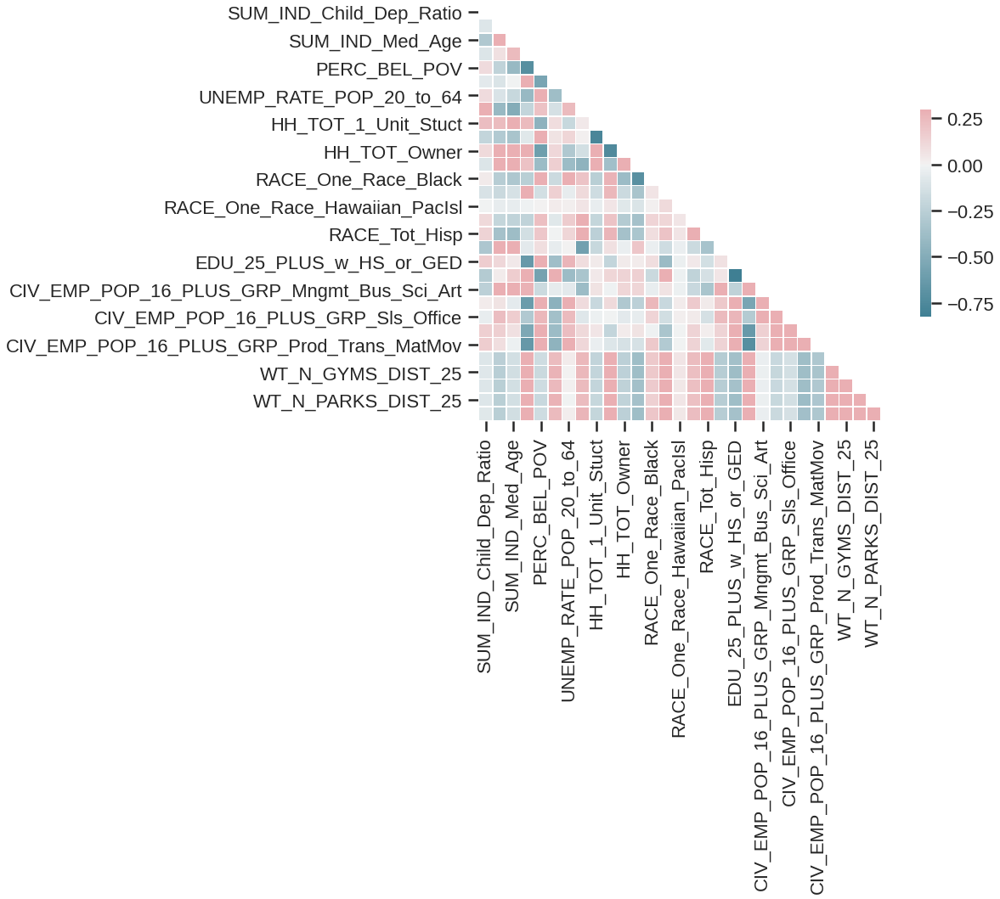

In [17]:
df_data = df_model[df_model.columns[~df_model.columns.isin(["GEOID","GEO_ID","NAME"])]].copy()

plot_corr(df_data)

## Trisurface Plot for Correlation Matrix

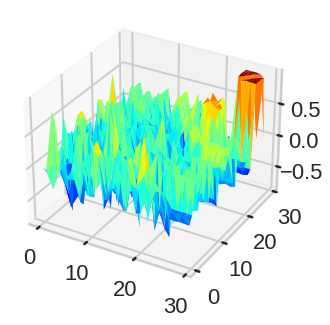

In [18]:
# generating correlation data 
df_corr = df_model[df_model.columns[~df_model.columns.isin(["GEOID","GEO_ID","NAME"])]].corr() 
df_corr.index = range(0, len(df_corr)) 
df_corr.rename(columns = dict(zip(df_corr.columns, df_corr.index)), inplace = True) 
df_corr = df_corr.astype(object) 
  
# Generating coordinates with corresponding correlation values 
for i in range(0, len(df_corr)): 
    for j in range(0, len(df_corr)): 
        if i != j: 
            df_corr.iloc[i, j] = (i, j, df_corr.iloc[i, j]) 
        else: 
            df_corr.iloc[i, j] = (i, j, 0) 

df_list = [] 
  
# flattening dataframe values 
for sub_list in df_corr.values: 
    df_list.extend(sub_list) 

# converting list of tuples into trivariate dataframe 
plot_df = pd.DataFrame(df_list) 
  
fig = plt.figure() 
ax = Axes3D(fig) 
  
# plotting 3D trisurface plot 
ax.plot_trisurf(plot_df[0], plot_df[1], plot_df[2], cmap = cm.jet, linewidth = 0.2) 
  
plt.show() 

# Dimensionality Reduction

## Principal Component Analysis (PCA)

Sources

https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html#Choosing-the-number-of-components

PCA works by using orthogonal transformations to convert correlates features into a set of values of linearly uncorrelated features. What is left are features that contain the largest possible variance. One of the most important applications of PCA is for speeding up machine learning algorithms. 

Although PCA might be successful in reducing the dimensionality of the data, it does not seem to visualize clusters very intuitively. This happens often with high dimensional data because it is typically clustered around the same point and PCA extracts that information.

### Inspect the Coordinates of the Right-Singular Vectors

In [19]:
# Print the shape
print("X:", X.shape)

# Find the minimum dimension
s = min(X.shape)
print("s = min({}, {}) == {}".format(X.shape[0], X.shape[1], s))

X: (73056, 30)
s = min(73056, 30) == 30


In [20]:
# Singular Value Decomposition
U, Sigma, VT = np.linalg.svd(X, full_matrices=False)

print("U:", U.shape)
print("Sigma:", Sigma.shape)
print("VT:", VT.shape)

U: (73056, 30)
Sigma: (30,)
VT: (30, 30)


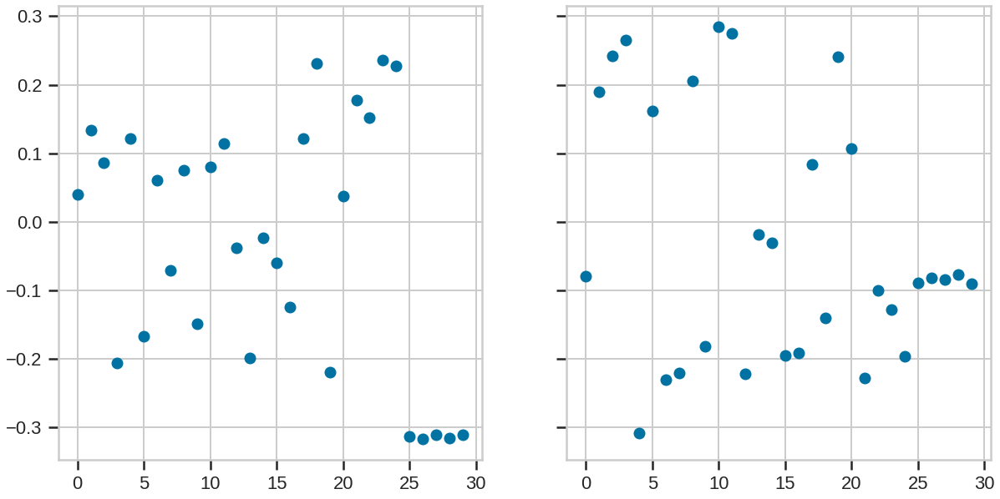

In [21]:
# Inspect the coordinates of the top two (k_approx, below) right-singular vectors
m, d = X.shape
k_approx = 2
assert k_approx <= s

# Plot the components of the first k_approx=2 singular vectors
fig, axs = plt.subplots(1, k_approx, sharex=True, sharey=True,
                        figsize=(10*k_approx, 10))
for k in range(k_approx):
    axs[k].scatter(np.arange(min(m, d)), VT[k, :].T)

### Explained Variance Ratio

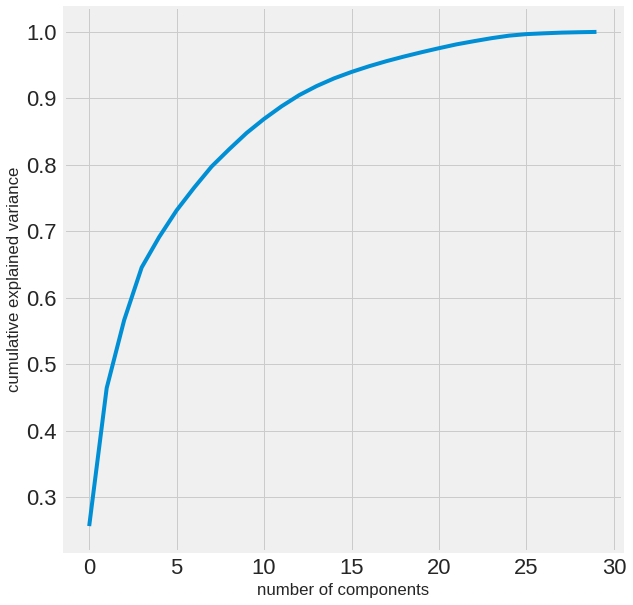

In [22]:
X_pca = PCA().fit(X)
fig = plt.figure(figsize=(10, 10))
plt.style.use("fivethirtyeight")
plt.plot(np.cumsum(X_pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

### 2D Scatter Plot

In [23]:
pca = PCA(n_components=2, svd_solver='full')
X_pca = pca.fit_transform(X)

print("Explained variation per principal component: {} \n".format(pca.explained_variance_ratio_))
print("Cumulative explained variation of the principal components: {}".format(np.sum(pca.explained_variance_ratio_)))

Explained variation per principal component: [0.25680301 0.20756129] 

Cumulative explained variation of the principal components: 0.4643642979193596


(-9.128958016625042,
 10.952953176637067,
 -7.4672972460329445,
 12.614613947229163)

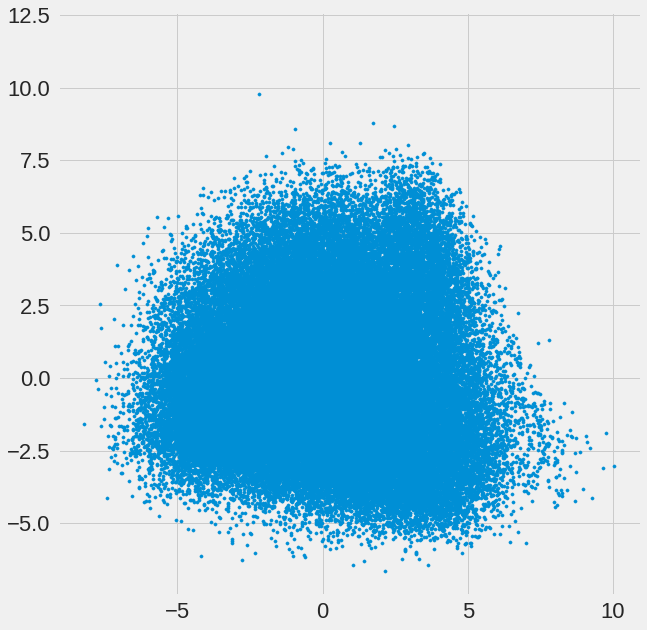

In [24]:
# It's possible to take the original data and project it onto the 2-dimensional subspace defined by the first two right-singular vectors.
df_pca = pd.DataFrame(data=X_pca, columns=['component_1', 'component_2'])

fig = plt.figure(figsize=(10, 10))
plt.style.use("fivethirtyeight")

plt.scatter(df_pca["component_1"], df_pca["component_2"], s=10)

ax = plt.gca()
ax.axis('square')

### 3D Scatter Plot

In [25]:
pca = PCA(n_components=3, svd_solver='full')
X_pca = pca.fit_transform(X)

print("Explained variation per principal component: {} \n".format(pca.explained_variance_ratio_))

print("Cumulative explained variation of the principal components: {}".format(np.sum(pca.explained_variance_ratio_)))

Explained variation per principal component: [0.25680301 0.20756129 0.10227783] 

Cumulative explained variation of the principal components: 0.5666421327034153


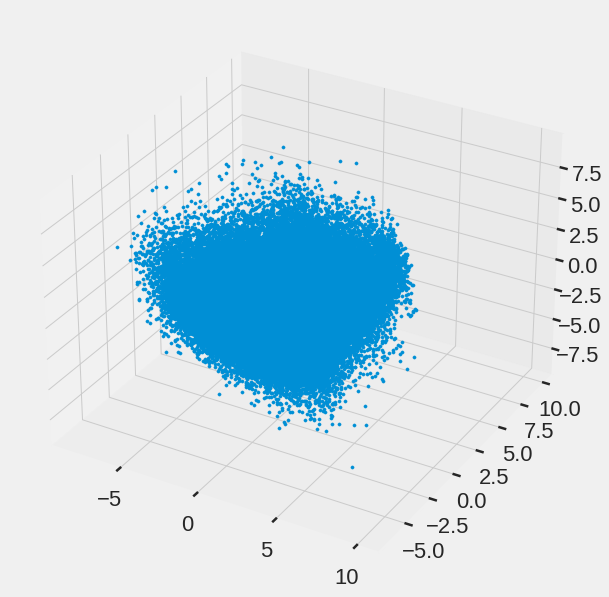

In [26]:
fig = plt.figure(figsize=(10,10))

ax = fig.add_subplot(111, projection='3d')
plt.style.use("fivethirtyeight")
plt.scatter(X_pca[:, 0], X_pca[:, 1], zs=X_pca[:, 2], depthshade=False, s=10)
plt.show()

## t-distributed Stochastic Neighbor Embedding (t-SNE)

Sources

https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b

https://learning.oreilly.com/library/view/hands-on-ensemble-learning/9781789612851/c3066f02-b587-4613-9bc5-25ca43ebec4b.xhtml

t-Distributed Stochastic Neighbor Embedding (t-SNE) is another technique for dimensionality reduction and is particularly well suited for the visualization of high-dimensional datasets. Contrary to PCA, it is not a mathematical technique but a probablistic one.

t-SNE minimizes the divergence between two distributions: a distribution that measures pairwise similarities of the input objects and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding.

It is highly recommended to use another dimensionality reduction method (e.g. PCA for dense data or TruncatedSVD for sparse data) before using t-SNE to reduce the number of dimensions to a reasonable amount if the number of features is very high.

In [14]:
# scikit-learn chooses the minimum number of principal components such that 95% of the variance is retained.
pca = PCA(.95, svd_solver="full") 

# Transform the data
X_pca = pca.fit_transform(X)

# The number of total components
print("The total number of principal components: {} \n".format(len(pca.explained_variance_ratio_)))

print("Explained variation per principal component: {} \n".format(pca.explained_variance_ratio_))

# The explained variance tells you how much information (variance) can be attributed to each of the principal components.
print("Cumulative explained variation for the principal components: {}".format(np.sum(pca.explained_variance_ratio_)))

The total number of principal components: 18 

Explained variation per principal component: [0.25680301 0.20756129 0.10227783 0.07908216 0.0457931  0.04019259
 0.03406367 0.0318191  0.02583446 0.02459455 0.02119038 0.01894909
 0.01669356 0.01368523 0.01158092 0.00968708 0.00855905 0.00767776] 

Cumulative explained variation for the principal components: 0.9560448274769612


In [15]:
time_start = time.time()

tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
X_pca_tsne = tsne.fit_transform(X_pca)

print("Time elapsed: {} seconds".format(time.time()-time_start))

df_pca_tsne = pd.DataFrame(data=X_pca_tsne, columns=["component_1", "component_2"])

Time elapsed: 301.0219056606293 seconds


### 2D Scatter Plot

<AxesSubplot:xlabel='component_1', ylabel='component_2'>

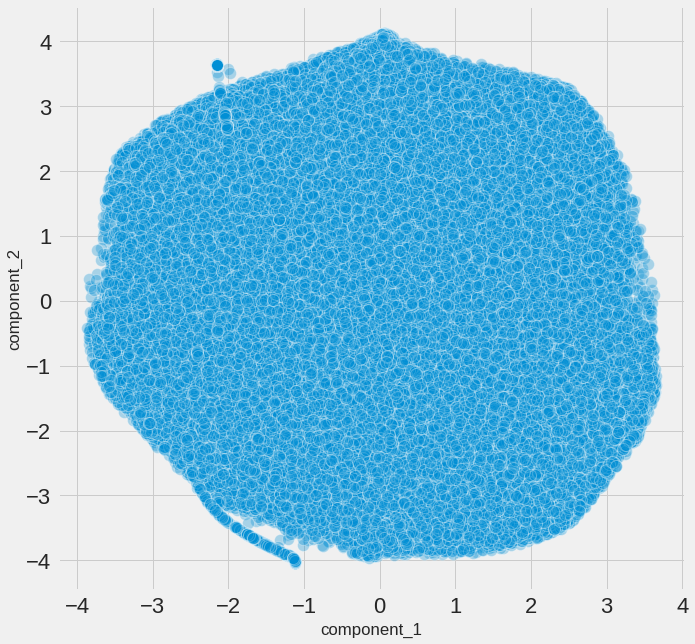

In [29]:
plt.figure(figsize=(10,10))
plt.style.use("fivethirtyeight")
sns.scatterplot(
    x="component_1", y="component_2",
    palette=sns.color_palette("hls", 10),
    data=df_pca_tsne,
    legend="full",
    alpha=0.3,
)

# Clustering Models

Sources

https://scikit-learn.org/stable/modules/clustering.html#clustering

https://nbviewer.jupyter.org/github/bejar/AMLTNotebooks/tree/master/Notebooks/

https://blog.floydhub.com/introduction-to-k-means-clustering-in-python-with-scikit-learn/

https://realpython.com/k-means-clustering-python/

https://towardsdatascience.com/an-introduction-to-clustering-algorithms-in-python-123438574097

https://towardsdatascience.com/the-5-clustering-algorithms-data-scientists-need-to-know-a36d136ef68

https://machinelearningmastery.com/clustering-algorithms-with-python/

In [18]:
# Save the results of the different clustering methods in a dictionary
cluster_results = {}

In [19]:
# Choose the appropriate Dimensionality Reduction technique
X_cluster = X_pca_tsne

## Partitioning Methods

In [32]:
# Choose the maximum number of clusters to test
max_clusters = 50

### KMeans

##### Characteristics

*Parameters:* number of clusters

*Scalability:* Very large n_smaples

*Usecase:* General-purpose, even cluster size, flat geometry, not too many clusters

*Geometry (metric used):* Distances between points

#### Choose the Appropriate Number of Clusters

In [33]:
time_start = time.time()

# Calculate the internal criteria that measure properties expected in a good clustering, compact and well-separated groups
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# Create lists that hold the values of the different internal metrics for each k
sse = []
silhouette = []
calinski_harabasz = []
davies_bouldin = []

for k in range(2, max_clusters+1):
    model = KMeans(n_clusters=k, **kmeans_kwargs)
    model.fit(X_cluster)
    labels = model.fit_predict(X_cluster)
    
    sse.append(model.inertia_)
    
    score = silhouette_score(X_cluster, labels)
    silhouette.append(score)
    
    score = calinski_harabasz_score(X_cluster, labels)
    calinski_harabasz.append(score)
    
    score = davies_bouldin_score(X_cluster, labels)
    davies_bouldin.append(score)
    
print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 5298.998328208923 seconds


##### Elbow Method - SSE

SSE: Quadratic error/Distorsion (k-means); the lower number the better

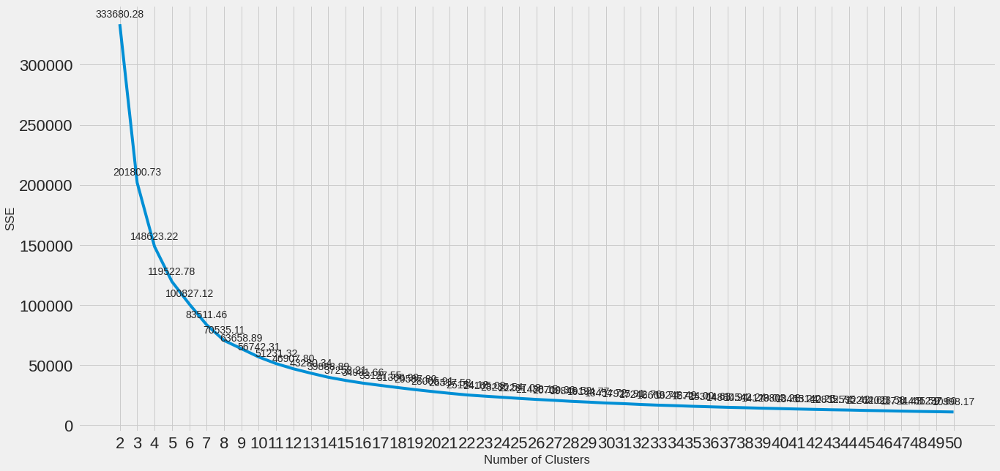

In [34]:
plot_internal_validity(max_clusters, sse, "SSE")

In [35]:
kl = KneeLocator(
    range(2, max_clusters+1), sse, curve="convex", direction="decreasing"
)

n_clusters = kl.elbow
n_clusters

10

##### Internal Validity Measures

These indices do not require ground truth labels. They measure properties expected in a good clustering: compact groups and well-separated groups 

The indices are based on the model of the groups. We can use indices based on the attributes’ values measuring the properties of a good clustering. The indices are based on statistical properties of the attributes of the model: value distribution and distances distribution.

Silhouette Coefficient: maximum class spread/variance; the higher number the better

The silhouette coefficient is a measure of cluster cohesion and separation (i.e., maximum class spread/variance). It quantifies how well a data point fits into its assigned cluster based on two factors: how close the data point is to other points in the cluster; how far away the data point is from points in other clusters. Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters. 

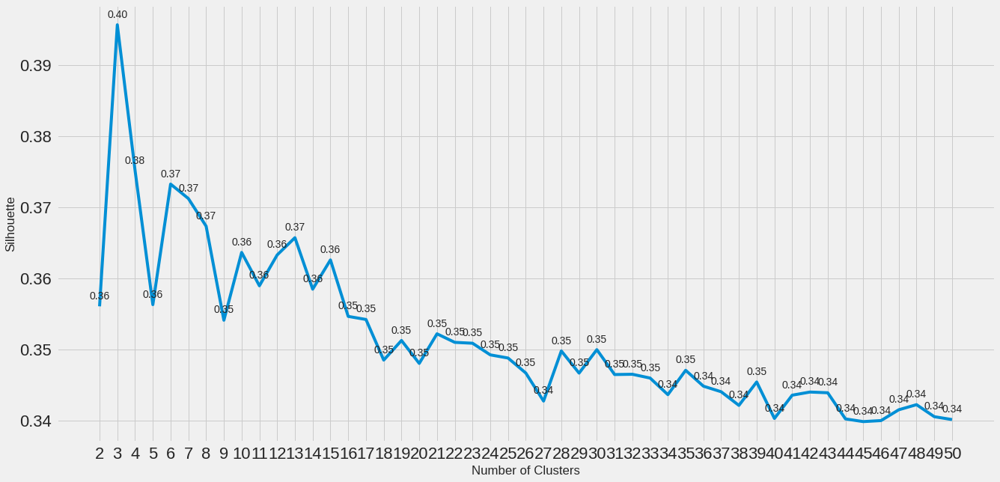

In [36]:
plot_internal_validity(max_clusters, silhouette, "Silhouette")

Calinski-Harabasz Index: interclass-intraclass distance ratio; the higher the number the better

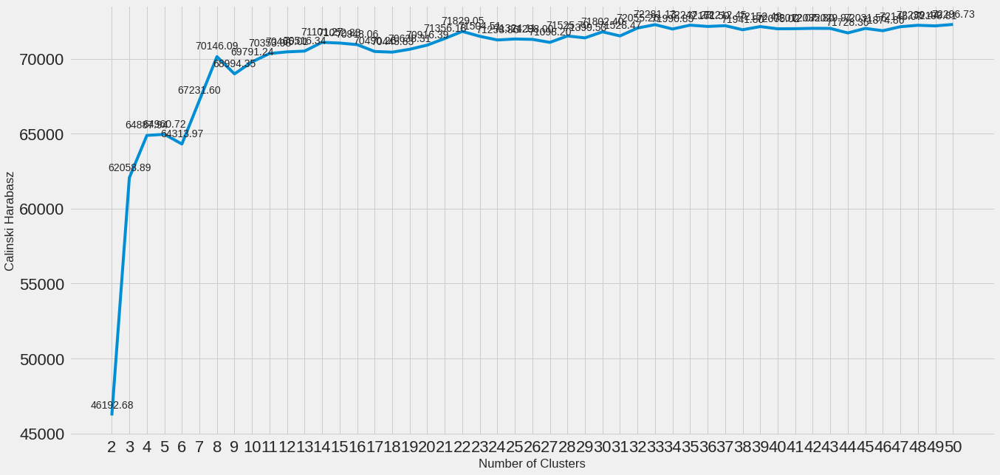

In [37]:
plot_internal_validity(max_clusters, calinski_harabasz, "Calinski Harabasz")

Davies-Bouldin Criteria: maximum interclass-intraclass distance ratio; the lower the number the better

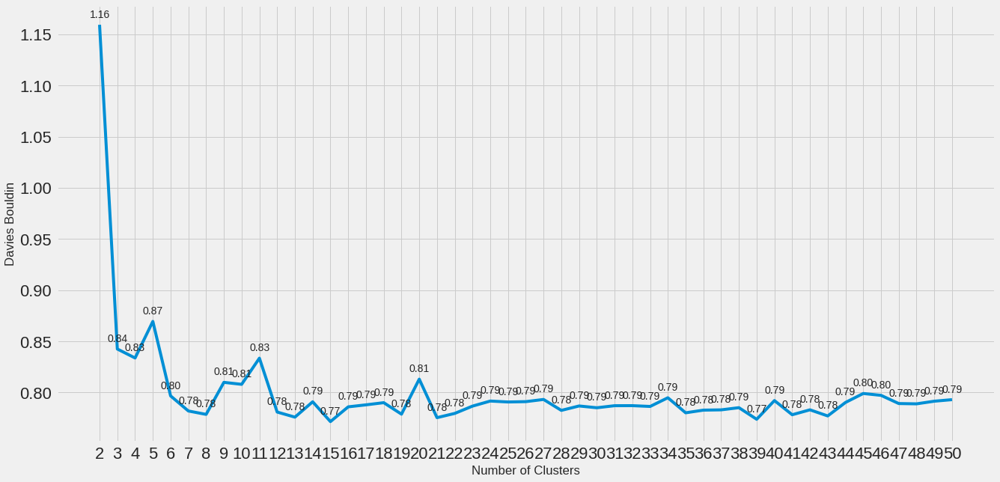

In [38]:
plot_internal_validity(max_clusters, davies_bouldin, "Davies Bouldin")

##### The Gap Statistic

Sources

https://towardsdatascience.com/clustering-evaluation-strategies-98a4006fcfc

https://github.com/milesgranger/gap_statistic

https://anaconda.org/milesgranger/gap-statistic/notebook

A powerful statistical method to find the optimal number of clusters. Assess the number of clusters comparing a clustering with the expected distribution of data given the null hypothesis (no clusters) 

Computes the different clusterings of the data increasing the number of clusters and compares to clusters of data generated from a uniform distribution 

The inter-class distance matrix Sw is computed for both and compared. The correct number of clusters is where the widest gap appears between the Sw of the data and the unform data.

In [39]:
# Create an "optimalK" object
optimalK = OptimalK(parallel_backend='rust')
optimalK

OptimalK(n_jobs=14, parallel_backend="rust")

In [40]:
# Call "optimalK" with a list of clusters to fit to
n_clusters = optimalK(X_cluster, cluster_array=np.arange(1, max_clusters+1))
print('Optimal clusters: ', n_clusters)

Optimal clusters:  34


In [41]:
# A DataFrame of gap values with each passed cluster count is now available
#optimalK.gap_df.head()

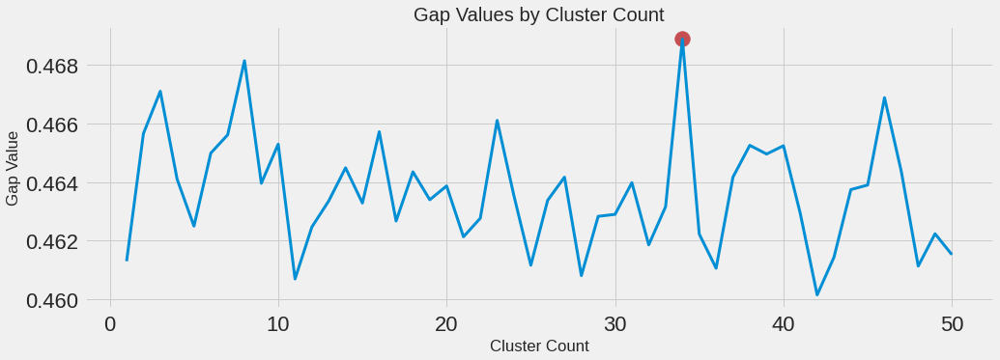

In [42]:
# Plot the n_clusters against their gap values
fig = plt.figure(figsize=(15,5))
plt.style.use("fivethirtyeight")
plt.plot(optimalK.gap_df.n_clusters, optimalK.gap_df.gap_value, linewidth=3)
plt.scatter(optimalK.gap_df[optimalK.gap_df.n_clusters == n_clusters].n_clusters,
            optimalK.gap_df[optimalK.gap_df.n_clusters == n_clusters].gap_value, s=250, c='r')
plt.grid(True)
plt.xlabel('Cluster Count')
plt.ylabel('Gap Value')
plt.title('Gap Values by Cluster Count')
plt.show()

#### Model with Optimal Number of Clusters

In [43]:
# Select the optimal number of clusters
optimal_clusters = 50

In [44]:
time_start = time.time()

# Instantiate the k-means algorithm
kmeans_kwargs = {
    "init": "k-means++",
    "n_clusters": optimal_clusters,
    "n_init": 50,
    "max_iter": 500,
    "algorithm": "full",
    "random_state": 42,
}

kmeans = KMeans(**kmeans_kwargs)

# Fit the algorithm to the features
kmeans.fit(X_cluster)

# Save the model results in the dictionary
cluster_results["kmeans"] = kmeans

# Pickle the model results
with open("kmeans_results.obj", 'wb') as fp:
    pickle.dump(kmeans, fp)

print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 22.08206534385681 seconds


In [45]:
# The number of iterations required to converge
kmeans.n_iter_

56

In [46]:
# Retrieve the labels
labels = kmeans.labels_

In [47]:
# The lowest SSE value
print("SSE (Inertia): {}".format(round(kmeans.inertia_, 4)))

SSE (Inertia): 10973.5459


In [48]:
# Compute the "silhouette score" for the algorithm
print("Silhouette Score: {}".format(silhouette_score(X_cluster, labels).round(4)))

Silhouette Score: 0.3416999876499176


In [49]:
# Compute the "calinski harabasz score" for the algorithm
print("Calinski Harabasz Score: {}".format(calinski_harabasz_score(X_cluster, labels).round(4)))

Calinski Harabasz Score: 72462.5912


In [50]:
# Compute the "davies bouldin score" for the algorithm
print("Davies Bouldin Score: {}".format(davies_bouldin_score(X_cluster, labels).round(4)))

Davies Bouldin Score: 0.7941


#### Visualization of Clusters

##### 2D

In [51]:
# The dataset utilized for clustering may have used more than 2 components
# So, take the original processed matrix "X" and project it onto 2 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_tsne(X_cluster, 2, labels)

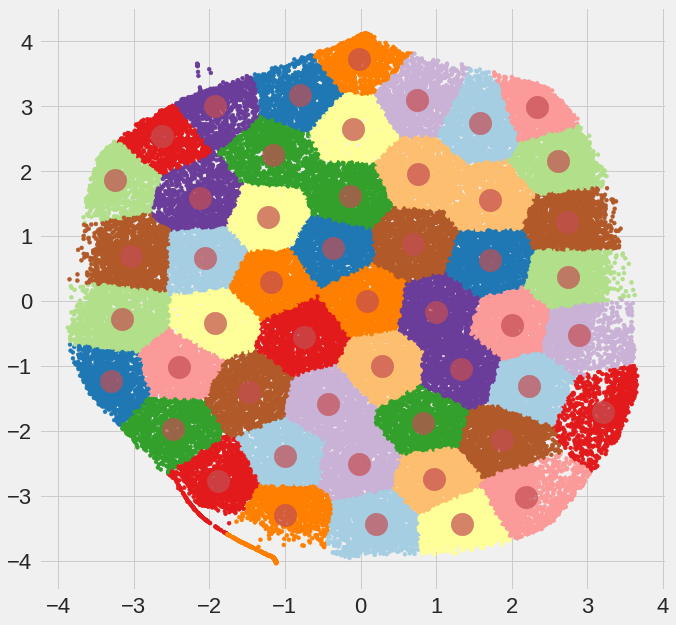

In [52]:
plot_2d(df_clust_viz, kmeans, True)

##### 3D

In [53]:
# The dataset utilized for clustering may have more than 3 components
# So, take the original processed matrix "X" and project it onto 3 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_pca(X, 3, labels)

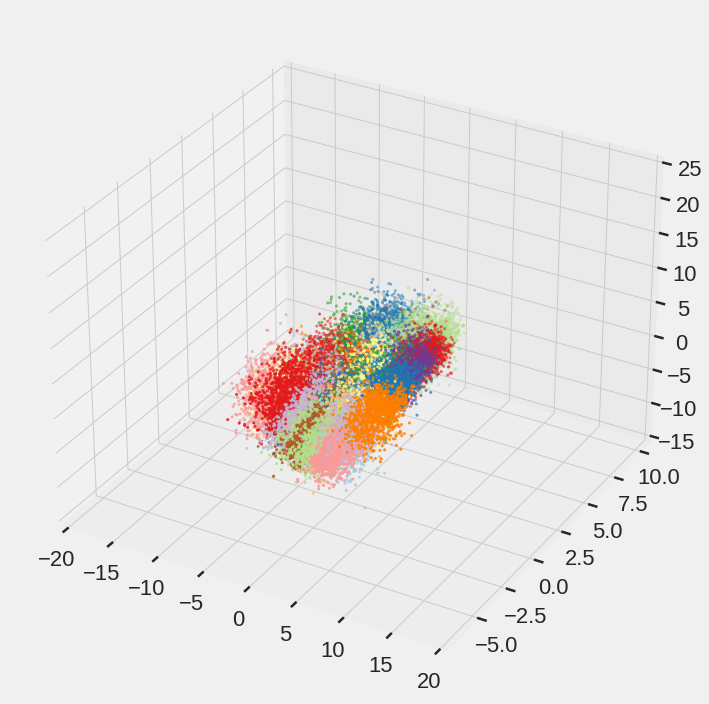

In [54]:
plot_3d(df_clust_viz)

### Mini-Batch KMeans

Mini-Batch K-Means is a modified version of k-means that makes updates to the cluster centroids using mini-batches of samples rather than the entire dataset, which can make it faster for large datasets, and perhaps more robust to statistical noise.

#### Choose the Appropriate Number of Clusters

In [55]:
# Create lists that hold the values of the different internal metrics for each k

time_start = time.time()

sse = []
silhouette = []
calinski_harabasz = []
davies_bouldin = []

for k in range(2, max_clusters+1):
    model = MiniBatchKMeans(n_clusters=k, init="random", n_init=10, max_iter=300, random_state=42)
    model.fit(X_cluster)
    labels = model.fit_predict(X_cluster)
    
    sse.append(model.inertia_)
    
    score = silhouette_score(X_cluster, labels)
    silhouette.append(score)
    
    score = calinski_harabasz_score(X_cluster, labels)
    calinski_harabasz.append(score)
    
    score = davies_bouldin_score(X_cluster, labels)
    davies_bouldin.append(score)
    
print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 5172.612241268158 seconds


##### Elbow Method - SSE

SSE: Quadratic error/Distorsion (k-means); the lower number the better

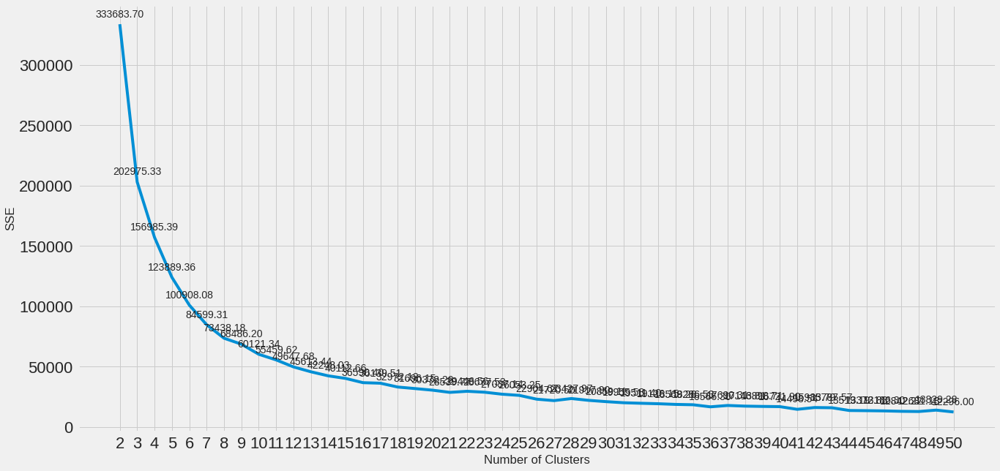

In [56]:
plot_internal_validity(max_clusters, sse, "SSE")

In [57]:
kl = KneeLocator(
    range(2, max_clusters+1), sse, curve="convex", direction="decreasing"
)

n_clusters = kl.elbow
n_clusters

10

##### Internal Validity Measures

Silhouette Coefficient: maximum class spread/variance; the higher number the better

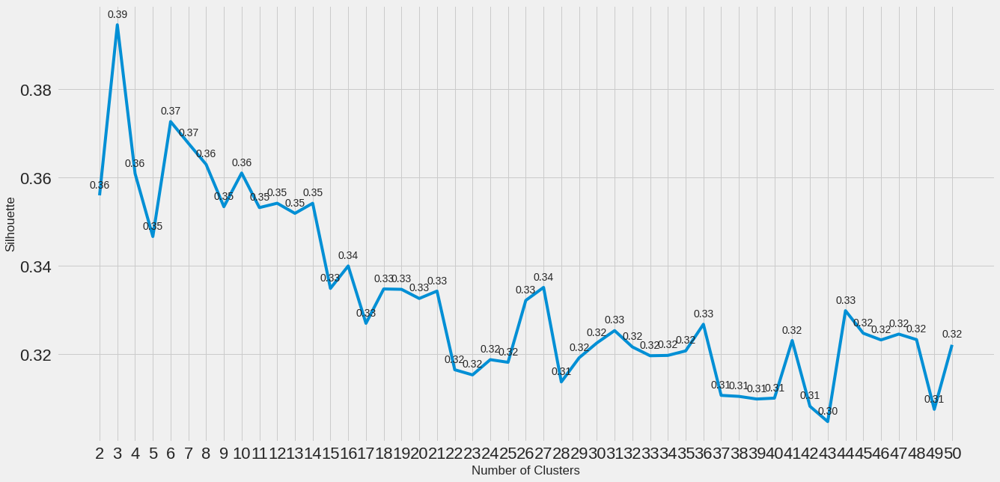

In [58]:
plot_internal_validity(max_clusters, silhouette, "Silhouette")

Calinski-Harabasz Index: interclass-intraclass distance ratio; the higher the number the better

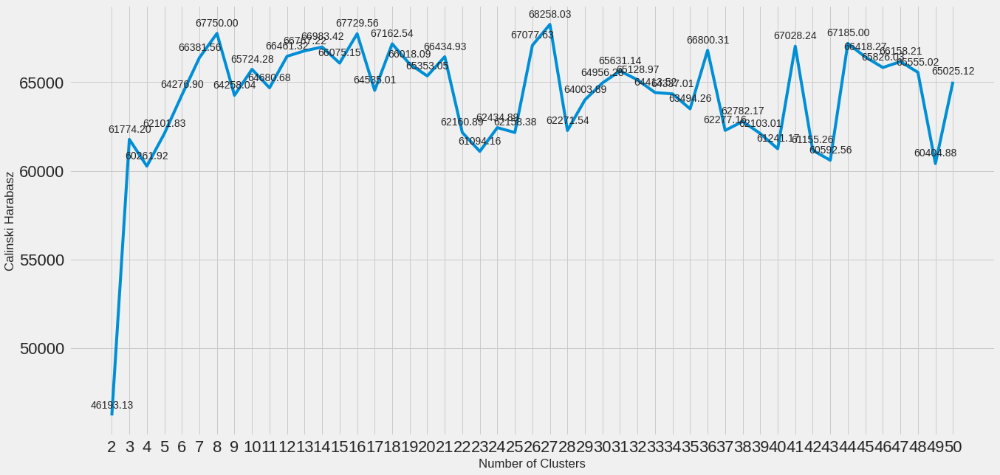

In [59]:
plot_internal_validity(max_clusters, calinski_harabasz, "Calinski Harabasz")

Davies-Bouldin Criteria: maximum interclass-intraclass distance ratio; the lower the number the better

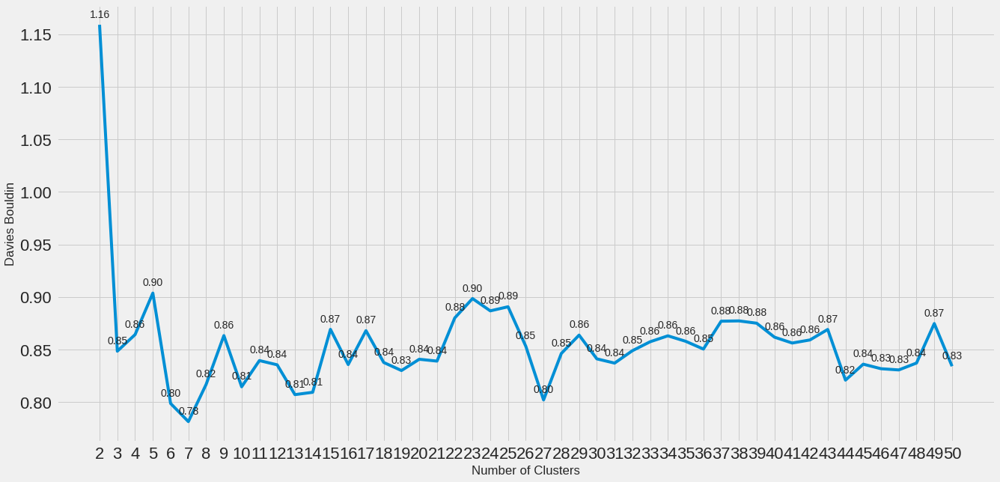

In [60]:
plot_internal_validity(max_clusters, davies_bouldin, "Davies Bouldin")

##### The Gap Statistic

In [61]:
# The "Gap Statistic" module allows using any clustering algorithm
# This function takes X (data) k, and func (the chosen clustering algorithm)
# It returns a tuple of the centorid locations, and the labels assigned to X

def special_clustering_func(X, k):
    """ 
    Special clustering function which uses the MeanShift
    model from sklearn.
    
    These user defined functions *must* take the X and a k 
    and can take an arbitrary number of other kwargs, which can
    be pass with `clusterer_kwargs` when initializing OptimalK
    """
    
    # Here you can do whatever clustering algorithm you heart desires,
    # but we'll do a simple wrap of the MeanShift model in sklearn.
    
    m = MiniBatchKMeans()
    m.fit(X)
    
    # Return the location of each cluster center,
    # and the labels for each point.
    return m.cluster_centers_, m.predict(X)

In [62]:
# Create an "optimalK" object
optimalK = OptimalK(clusterer=special_clustering_func)
optimalK

OptimalK(n_jobs=14, parallel_backend="joblib")

In [63]:
# Call "optimalK" with a list of clusters to fit to
n_clusters = optimalK(X_cluster, n_refs=3, cluster_array=np.arange(1, 20))
print('Optimal clusters: ', n_clusters)

Optimal clusters:  6


In [64]:
# A DataFrame of gap values with each passed cluster count is now available
#optimalK.gap_df.head()

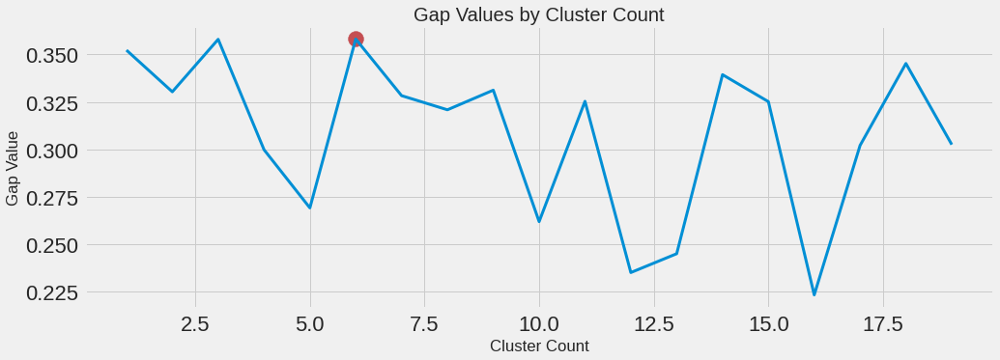

In [65]:
# Plot the n_clusters against their gap values
fig = plt.figure(figsize=(15,5))
plt.style.use("fivethirtyeight")
plt.plot(optimalK.gap_df.n_clusters, optimalK.gap_df.gap_value, linewidth=3)
plt.scatter(optimalK.gap_df[optimalK.gap_df.n_clusters == n_clusters].n_clusters,
            optimalK.gap_df[optimalK.gap_df.n_clusters == n_clusters].gap_value, s=250, c='r')
plt.grid(True)
plt.xlabel('Cluster Count')
plt.ylabel('Gap Value')
plt.title('Gap Values by Cluster Count')
plt.show()

#### Model with Optimal Number of Clusters

In [66]:
# Select the optimal number of clusters
optimal_clusters = 50

In [67]:
time_start = time.time()

minibatch_kmeans = MiniBatchKMeans(n_clusters=optimal_clusters, init="k-means++", n_init=50, max_iter=500, random_state=42)

# Fit the algorithm to the features
minibatch_kmeans.fit(X_cluster)

# Save the model results
cluster_results["minibatch_kmeans"] = minibatch_kmeans

# Pickle the model results
with open("minibatch_kmeans_results.obj", 'wb') as fp:
    pickle.dump(minibatch_kmeans, fp)

print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 2.7759761810302734 seconds


In [68]:
# The number of iterations required to converge
minibatch_kmeans.n_iter_

535

In [69]:
# Retrieve the labels
labels = minibatch_kmeans.labels_

In [70]:
# The lowest SSE value
print("SSE (Inertia): {}".format(round(minibatch_kmeans.inertia_, 4)))

SSE (Inertia): 11546.4155


In [71]:
# Compute the "silhouette score" for the algorithm
print("Silhouette Score: {}".format(silhouette_score(X_cluster, labels).round(4)))

Silhouette Score: 0.3287999927997589


In [72]:
# Compute the "calinski harabasz score" for the algorithm
print("Calinski Harabasz Score: {}".format(calinski_harabasz_score(X_cluster, labels).round(4)))

Calinski Harabasz Score: 69040.65


In [73]:
# Compute the "davies bouldin score" for the algorithm
print("Davies Bouldin Score: {}".format(davies_bouldin_score(X_cluster, labels).round(4)))

Davies Bouldin Score: 0.833


#### Visualization of Clusters

##### 2D

In [74]:
# The dataset utilized for clustering may have used more than 2 components
# So, take the original processed matrix "X" and project it onto 2 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_tsne(X_cluster, 2, labels)

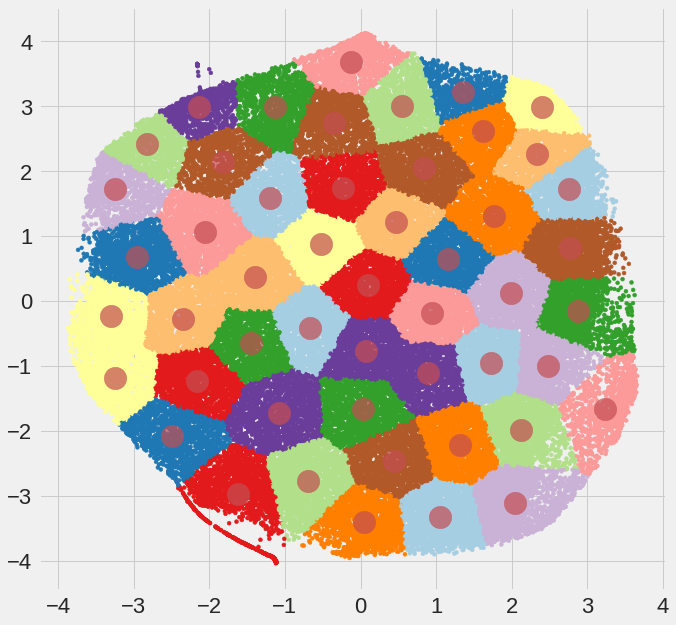

In [75]:
plot_2d(df_clust_viz, minibatch_kmeans, True)

##### 3D

In [76]:
# The dataset utilized for clustering may have more than 3 components
# So, take the original processed matrix "X" and project it onto 3 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_pca(X, 3, labels)

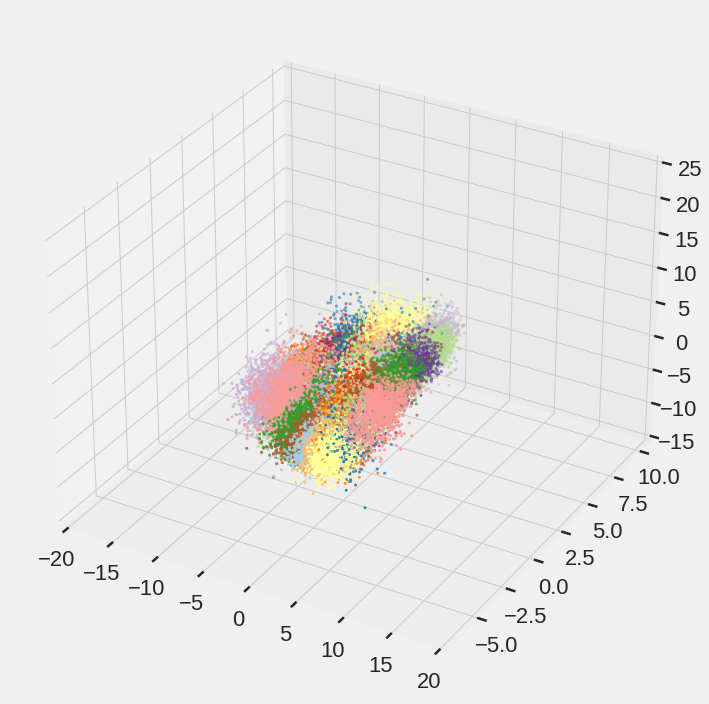

In [77]:
plot_3d(df_clust_viz)

### Spectral Clustering

##### Characteristics

*Parameters:* number of clusters

*Scalability:* Medium n_samples, small n_clusters

*Usecase:* Few clusters, even clsuter size, non-flat geometry

*Geometry (metric used):* Graph distance (e.g., nearest-neighbor graph)

#### Choose the Appropriate Number of Clusters

In [78]:
time_start = time.time()

# Create lists that hold the values of the different internal metrics for each k
silhouette = []
calinski_harabasz = []
davies_bouldin = []

for k in range(2, max_clusters+1):
    model = SpectralClustering(n_clusters=k, affinity='nearest_neighbors', n_neighbors=50)
    model.fit(X_cluster)
    labels = model.fit_predict(X_cluster)
    
    score = silhouette_score(X_cluster, labels)
    silhouette.append(score)
    
    score = calinski_harabasz_score(X_cluster, labels)
    calinski_harabasz.append(score)
    
    score = davies_bouldin_score(X_cluster, labels)
    davies_bouldin.append(score)
    
print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 49008.791465997696 seconds


##### Internal Validity Measures

Silhouette Coefficient: maximum class spread/variance; the higher number the better

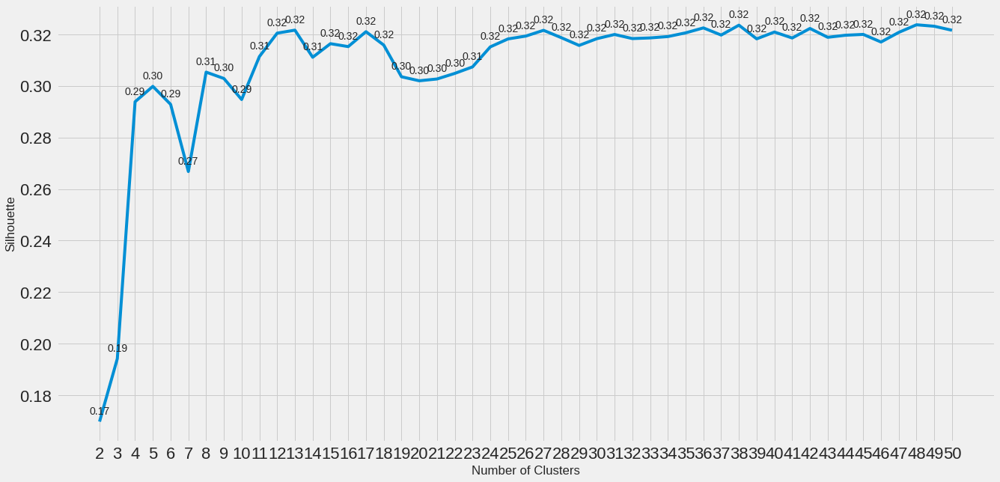

In [79]:
plot_internal_validity(max_clusters, silhouette, "Silhouette")

Calinski-Harabasz Index: interclass-intraclass distance ratio; the higher the number the better

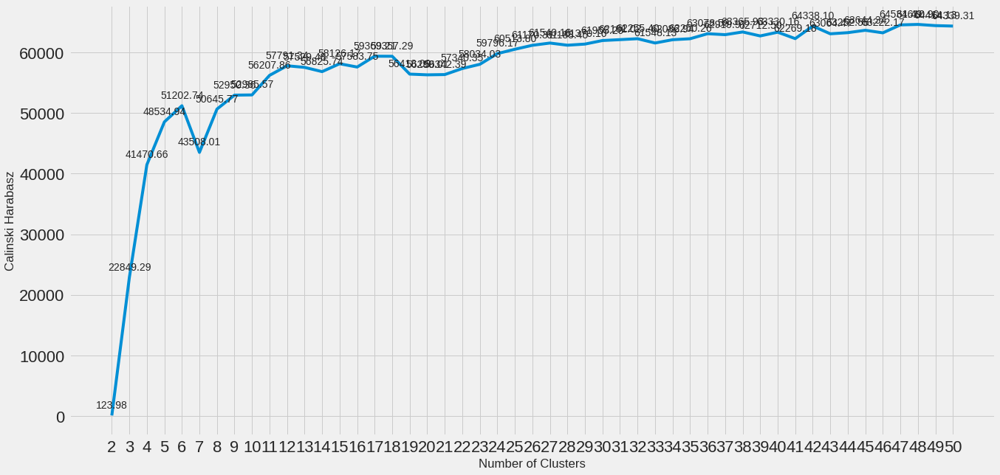

In [80]:
plot_internal_validity(max_clusters, calinski_harabasz, "Calinski Harabasz")

Davies-Bouldin Criteria: maximum interclass-intraclass distance ratio; the lower the number the better

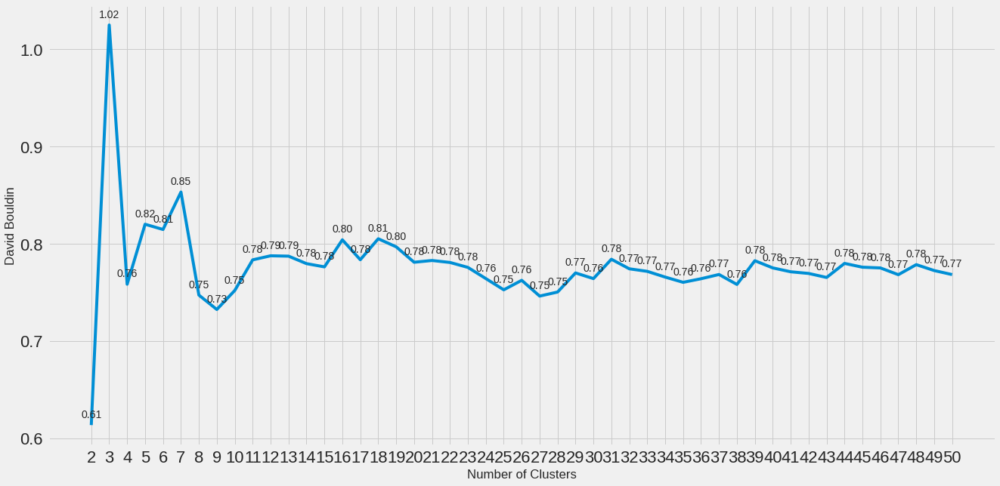

In [81]:
plot_internal_validity(max_clusters, davies_bouldin, "David Bouldin")

#### Model with Optimal Number of Clusters

In [82]:
# Select the optimal number of clusters
optimal_clusters = 50

In [83]:
time_start = time.time()

spectral_clustering = SpectralClustering(n_clusters=optimal_clusters, affinity='nearest_neighbors', n_neighbors=50)

# Fit the algorithm to the features
spectral_clustering.fit(X_cluster)

# Save the model results
cluster_results["spectral_clustering"] = spectral_clustering

# Pickle the model results
with open("spectral_clustering_results.obj", 'wb') as fp:
    pickle.dump(spectral_clustering, fp)

print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 498.03677105903625 seconds


In [84]:
# Retrieve the labels
labels = spectral_clustering.labels_

In [85]:
# Compute the "silhouette score" for the algorithm
print("Silhouette Score: {}".format(silhouette_score(X_cluster, labels).round(4)))

Silhouette Score: 0.3212999999523163


In [86]:
# Compute the "calinski harabasz score" for the algorithm
print("Calinski Harabasz Score: {}".format(calinski_harabasz_score(X_cluster, labels).round(4)))

Calinski Harabasz Score: 64344.1507


In [87]:
# Compute the "davies bouldin score" for the algorithm
print("Davies Bouldin Score: {}".format(davies_bouldin_score(X_cluster, labels).round(4)))

Davies Bouldin Score: 0.7612


#### Visualization of Clusters

##### 2D

In [88]:
# The dataset utilized for clustering may have used more than 2 components
# So, take the original processed matrix "X" and project it onto 2 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_tsne(X_cluster, 2, labels)

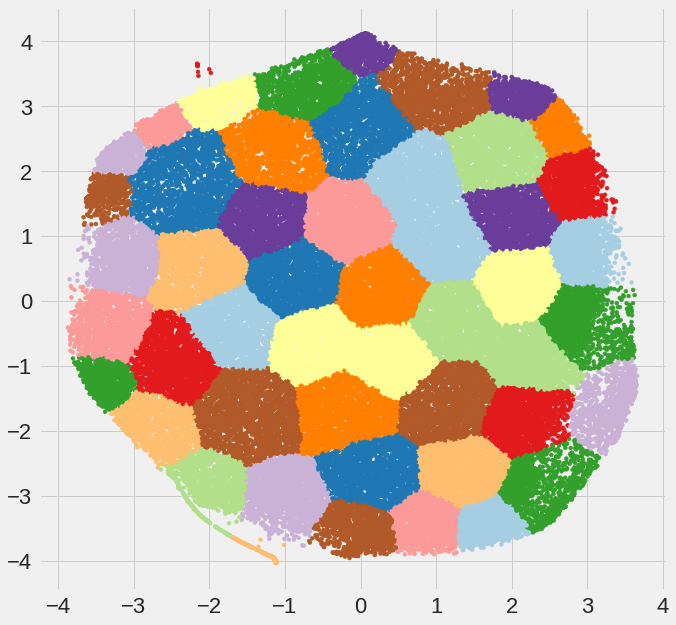

In [89]:
plot_2d(df_clust_viz, spectral_clustering, False)

##### 3D

In [90]:
# The dataset utilized for clustering may have more than 3 components
# So, take the original processed matrix "X" and project it onto 3 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_pca(X, 3, labels)

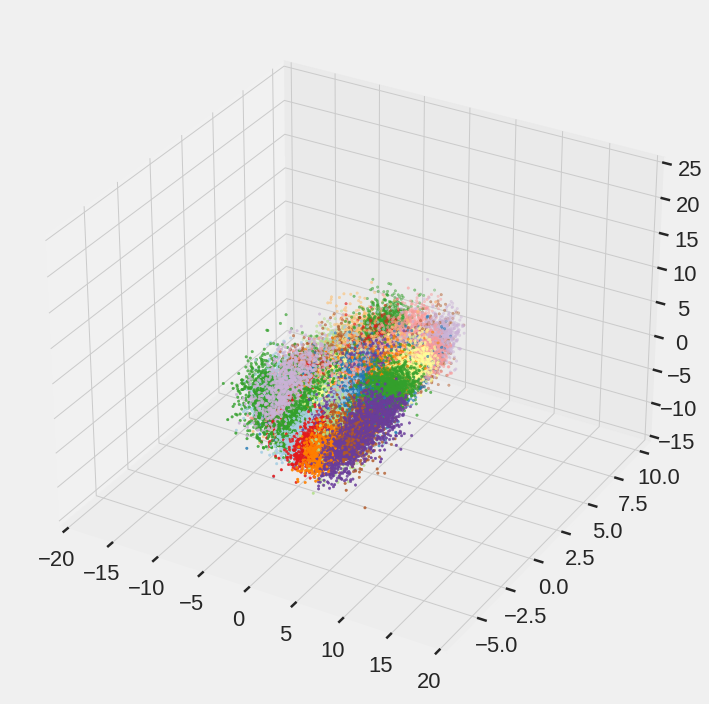

In [91]:
plot_3d(df_clust_viz)

## Hierarchical Method

In [92]:
# Choose the maximum number of clusters to test
max_clusters = 5

### Ward Linkage (Agglomerative Clustering)

##### Characteristics

*Parameters:* number of clusters or distance threshold

*Scalability:* Large n_samples and n_clusters

*Usecase:* Many clusters, possibly connectivity constraints

*Geometry (metric used):* distances between points

#### Choose the Appropriate Number of Clusters

In [93]:
time_start = time.time()

# Create lists that hold the values of the different internal metrics for each k
silhouette = []
calinski_harabasz = []
davies_bouldin = []

for k in range(2, max_clusters+1):
    model = AgglomerativeClustering(linkage="ward", n_clusters=k)
    model.fit(X_cluster)
    labels = model.fit_predict(X_cluster)
    
    score = silhouette_score(X_cluster, labels)
    silhouette.append(score)
    
    score = calinski_harabasz_score(X_cluster, labels)
    calinski_harabasz.append(score)
    
    score = davies_bouldin_score(X_cluster, labels)
    davies_bouldin.append(score)
    
print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 3192.0083150863647 seconds


##### Internal Validity Measures

Silhouette Coefficient: maximum class spread/variance; the higher number the better

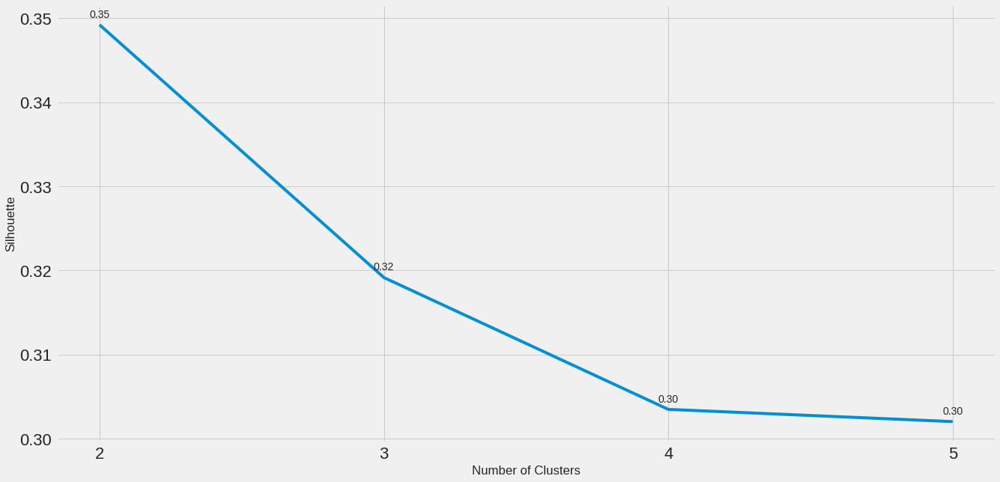

In [94]:
plot_internal_validity(max_clusters, silhouette, "Silhouette")

Calinski-Harabasz Index: interclass-intraclass distance ratio; the higher the number the better

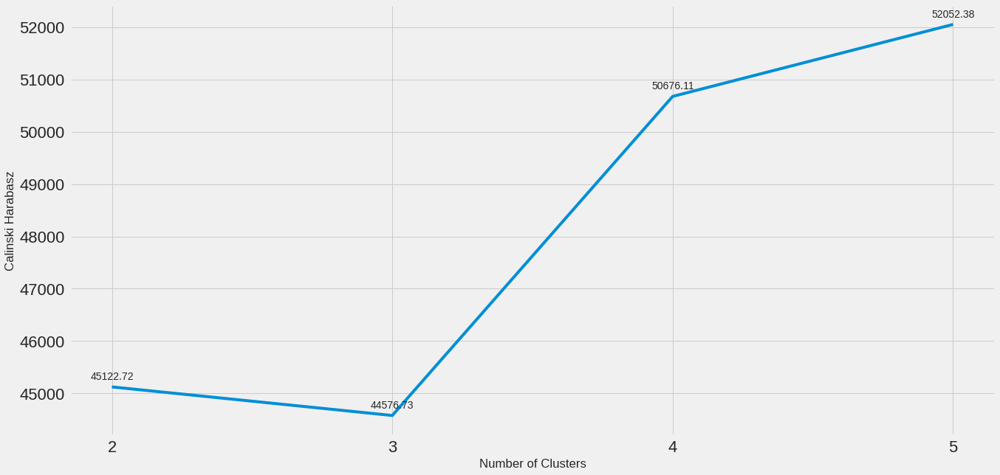

In [95]:
plot_internal_validity(max_clusters, calinski_harabasz, "Calinski Harabasz")

Davies-Bouldin Criteria: maximum interclass-intraclass distance ratio; the lower the number the better

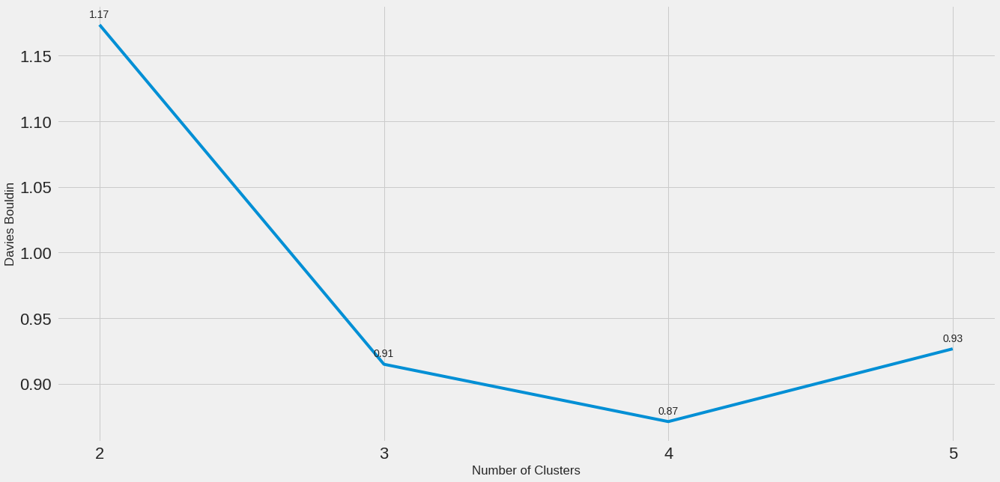

In [96]:
plot_internal_validity(max_clusters, davies_bouldin, "Davies Bouldin")

#### Model with Optimal Number of Clusters

In [16]:
# Select the optimal number of clusters
optimal_clusters = 50

In [20]:
time_start = time.time()

hierarchical_ward = AgglomerativeClustering(linkage="ward", n_clusters=optimal_clusters)

# Fit the algorithm to the features
hierarchical_ward.fit(X_cluster)

# Save the model results
cluster_results["hierarchical_ward"] = hierarchical_ward

# Pickle the model results
with open("hierarchical_ward_results.obj", 'wb') as fp:
    pickle.dump(hierarchical_ward, fp)

print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 432.5430853366852 seconds


In [21]:
# Retrieve the labels
labels = hierarchical_ward.labels_

In [22]:
# Compute the "silhouette score" for the algorithm
print("Silhouette Score: {}".format(silhouette_score(X_cluster, labels).round(4)))

Silhouette Score: 0.26899999380111694


In [23]:
# Compute the "calinski harabasz score" for the algorithm
print("Calinski Harabasz Score: {}".format(calinski_harabasz_score(X_cluster, labels).round(4)))

Calinski Harabasz Score: 58761.5265


In [24]:
# Compute the "davies bouldin score" for the algorithm
print("Davies Bouldin Score: {}".format(davies_bouldin_score(X_cluster, labels).round(4)))

Davies Bouldin Score: 0.9125


#### Visualization of Clusters

##### 2D

In [25]:
# The dataset utilized for clustering may have used more than 2 components
# So, take the original processed matrix "X" and project it onto 2 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_tsne(X_cluster, 2, labels)

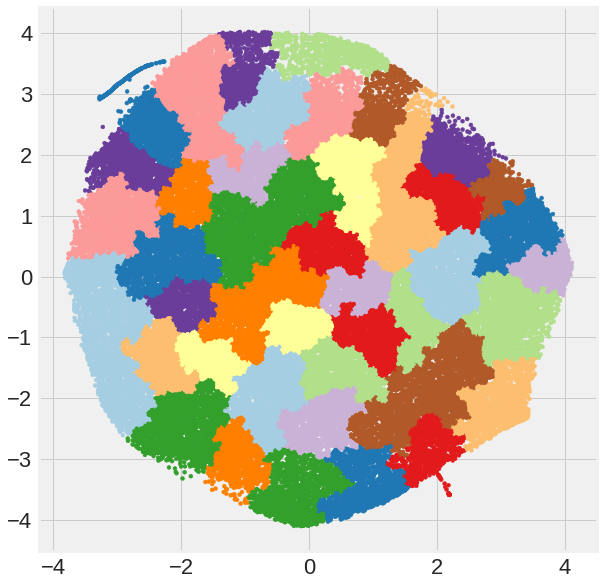

In [26]:
plot_2d(df_clust_viz, hierarchical_ward, False)

##### 3D

In [27]:
# The dataset utilized for clustering may have more than 3 components
# So, take the original processed matrix "X" and project it onto 3 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_pca(X, 3, labels)

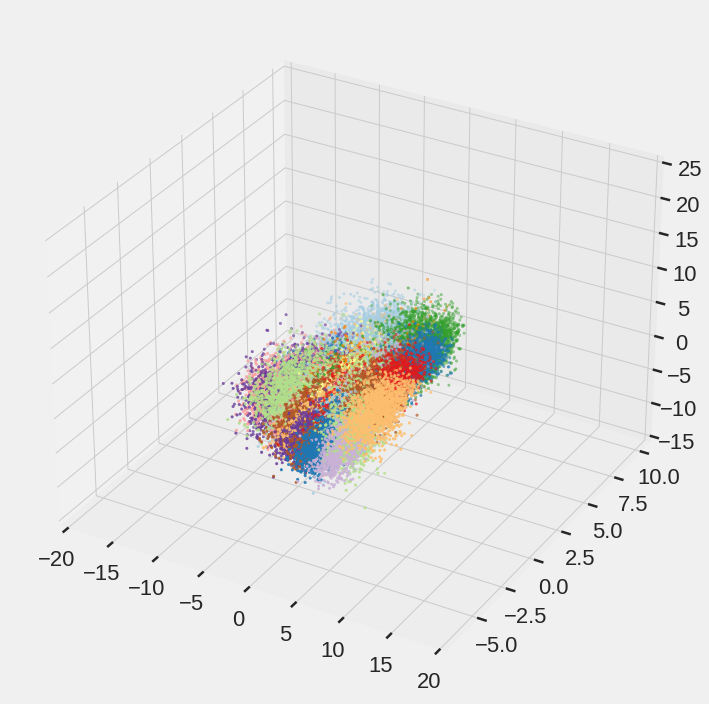

In [28]:
plot_3d(df_clust_viz)

### BIRCH

##### Characteristics

*Parameters:* branching factor, treshold, optional global clusterer

*Scalability:* Large n_clusters and n_samples. BIRCH does not scale very well to high dimensional data. As a rule of thumb if n_features is greater than twenty, it is generally better to use MiniBatchKMeans.

*Usecase:* Large dataset, outlier removal, data reduction

*Geometry (metric used):* Euclidean distance between points

#### Choose the Appropriate Number of Clusters

In [107]:
time_start = time.time()

# Create lists that hold the values of the different internal metrics for each k
silhouette = []
calinski_harabasz = []
davies_bouldin = []

for k in range(2, max_clusters+1):
    model = Birch(threshold=0.5, branching_factor=100, n_clusters=k)
    model.fit(X_cluster)
    labels = model.fit_predict(X_cluster)
    
    score = silhouette_score(X_cluster, labels)
    silhouette.append(score)
    
    score = calinski_harabasz_score(X_cluster, labels)
    calinski_harabasz.append(score)
    
    score = davies_bouldin_score(X_cluster, labels)
    davies_bouldin.append(score)
    
print("Time elapsed: {} seconds".format(time.time()-time_start))

Time elapsed: 323.14549684524536 seconds


##### Internal Validity Measures

Silhouette Coefficient: maximum class spread/variance; the higher number the better

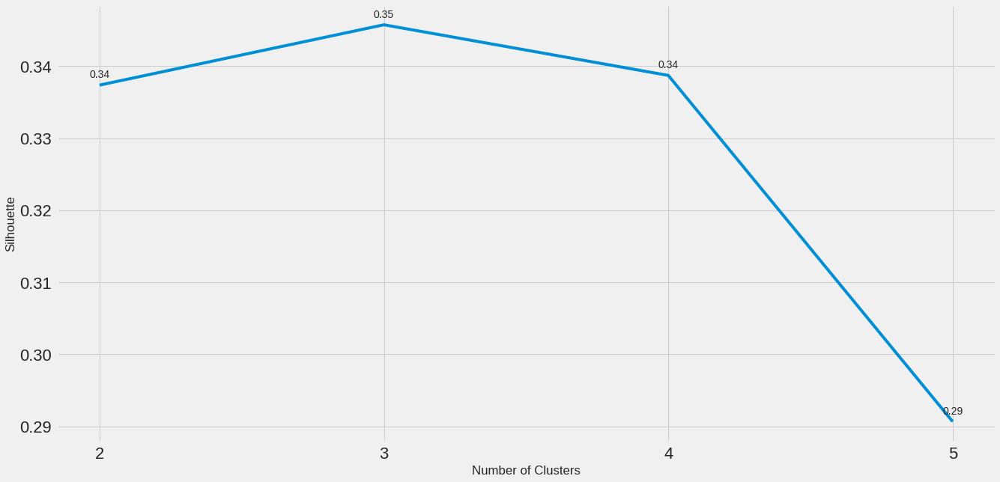

In [108]:
plot_internal_validity(max_clusters, silhouette, "Silhouette")

Calinski-Harabasz Index: interclass-intraclass distance ratio; the higher the number the better

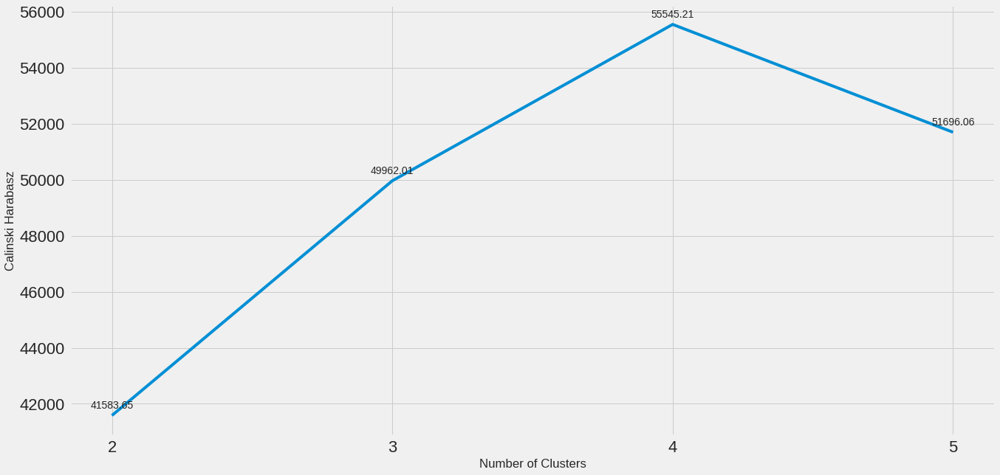

In [109]:
plot_internal_validity(max_clusters, calinski_harabasz, "Calinski Harabasz")

Davies-Bouldin Criteria: maximum interclass-intraclass distance ratio; the lower the number the better

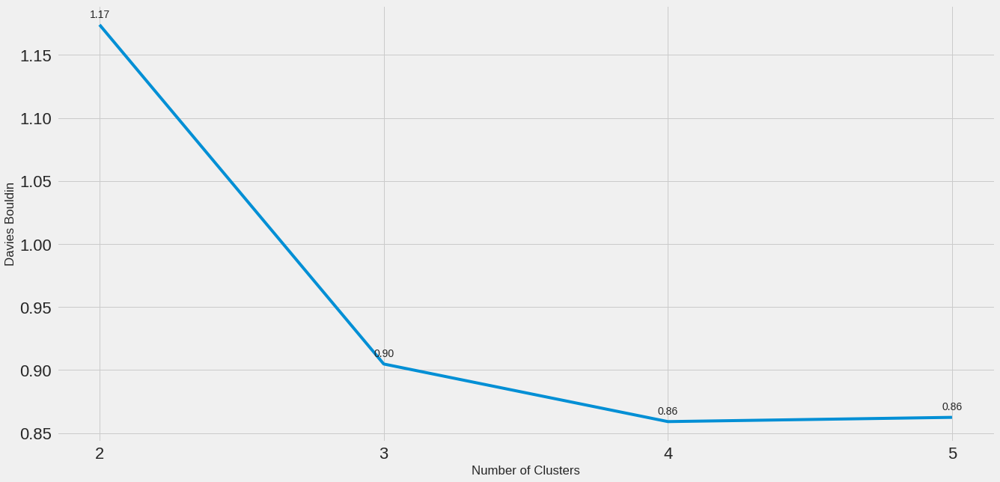

In [110]:
plot_internal_validity(max_clusters, davies_bouldin, "Davies Bouldin")

#### Model with Optimal Number of Clusters

In [29]:
# Select the optimal number of clusters
optimal_clusters = 50

In [30]:
time_start = time.time()

hierarchical_birch = Birch(threshold=0.01, n_clusters=optimal_clusters)

# Fit the algorithm to the features
hierarchical_birch.fit(X_cluster)

# Save the model results
cluster_results["hierarchical_birch"] = hierarchical_birch

# Pickle the model results
try:
    with open("hierarchical_birch_results.obj", 'wb') as fp:
        pickle.dump(hierarchical_birch, fp)
except Exception as e:
    print(e)
        
print("Time elapsed: {} seconds".format(time.time()-time_start))

maximum recursion depth exceeded while calling a Python object
Time elapsed: 135.7602767944336 seconds


In [31]:
# Retrieve the labels
labels = hierarchical_birch.labels_

In [32]:
# Compute the "silhouette score" for the algorithm
print("Silhouette Score: {}".format(silhouette_score(X_cluster, labels).round(4)))

Silhouette Score: 0.2583000063896179


In [33]:
# Compute the "calinski harabasz score" for the algorithm
print("Calinski Harabasz Score: {}".format(calinski_harabasz_score(X_cluster, labels).round(4)))

Calinski Harabasz Score: 57272.3798


In [34]:
# Compute the "davies bouldin score" for the algorithm
print("Davies Bouldin Score: {}".format(davies_bouldin_score(X_cluster, labels).round(4)))

Davies Bouldin Score: 0.9276


#### Visualization of Clusters

##### 2D

In [35]:
# The dataset utilized for clustering may have used more than 2 components
# So, take the original processed matrix "X" and project it onto 2 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_tsne(X_cluster, 2, labels)

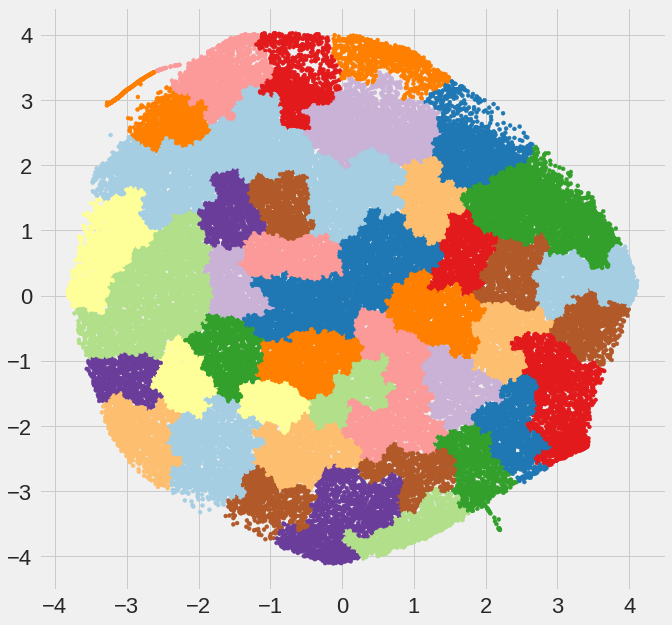

In [36]:
plot_2d(df_clust_viz, hierarchical_birch, False)

##### 3D

In [37]:
# The dataset utilized for clustering may have more than 3 components
# So, take the original processed matrix "X" and project it onto 3 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_pca(X, 3, labels)

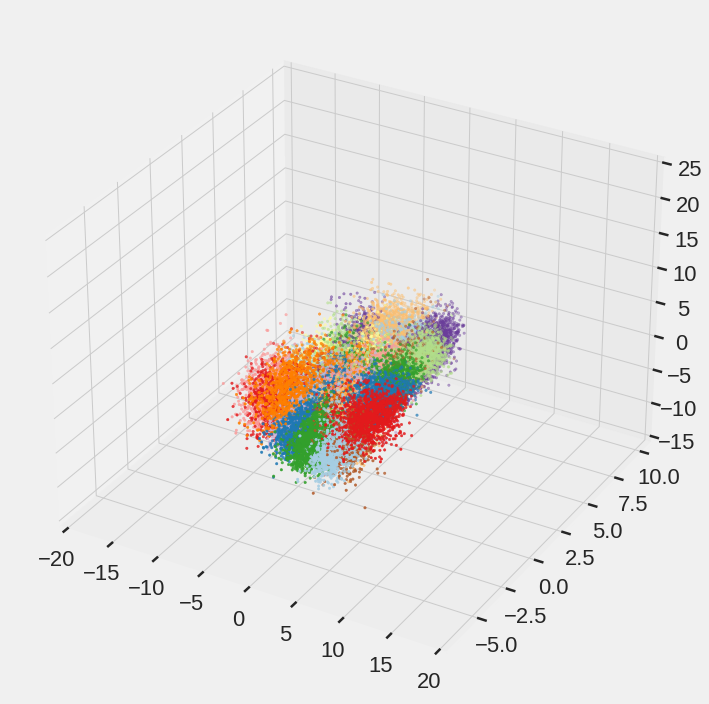

In [38]:
plot_3d(df_clust_viz)

# Evaluate the Constructed Models

## Internal Validity Measures

### Obtain the Results

In [39]:
model_names = ['kmeans', 'minibatch_kmeans', 'spectral_clustering', 'hierarchical_ward', 'hierarchical_birch']
silhouette = [0.3417, 0.3288, 0.3213, 0.269, 0.258]
calinski_harabasz = [72462.59, 69040.65, 64344., 58761.53, 57272.38]
davies_bouldin = [0.7941, 0.833, 0.76, 0.913, 0.928]

# for key in cluster_results.keys():
#     model_names.append(key)
#     model = cluster_results[key]
#     labels = model.labels_
    
#     score = silhouette_score(X_cluster, labels)
#     silhouette.append(score)
    
#     score = calinski_harabasz_score(X_cluster, labels)
#     calinski_harabasz.append(score)
    
#     score = davies_bouldin_score(X_cluster, labels)
#     davies_bouldin.append(score)

### Silhouette Coefficient

Silhouette Coefficient: maximum class spread/variance; the higher number the better

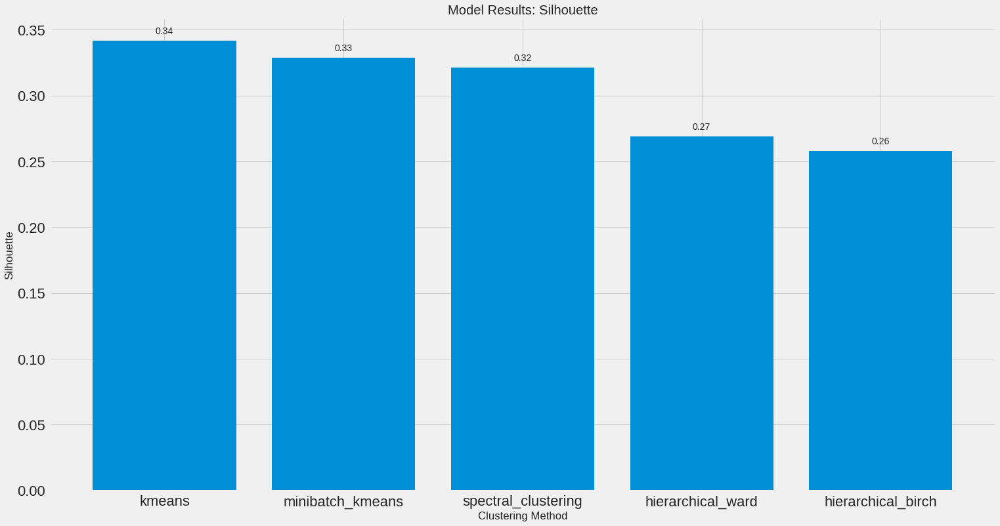

In [40]:
plot_model_results(silhouette, "Silhouette")

### Calinski-Harabasz Index

Calinski-Harabasz Index: interclass-intraclass distance ratio; the higher the number the better

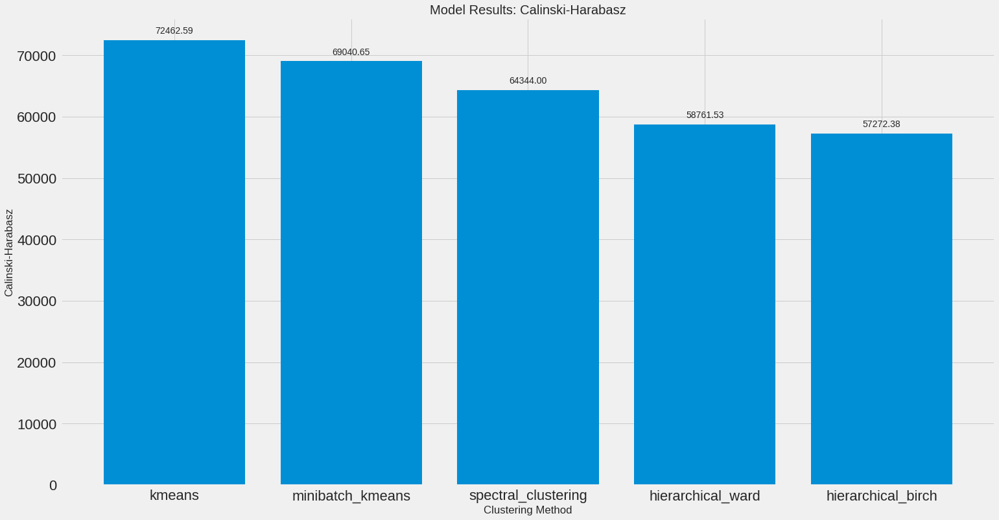

In [41]:
plot_model_results(calinski_harabasz, "Calinski-Harabasz")

### Davies-Bouldin Criteria

Davies-Bouldin Criteria: maximum interclass-intraclass distance ratio; the lower the number the better

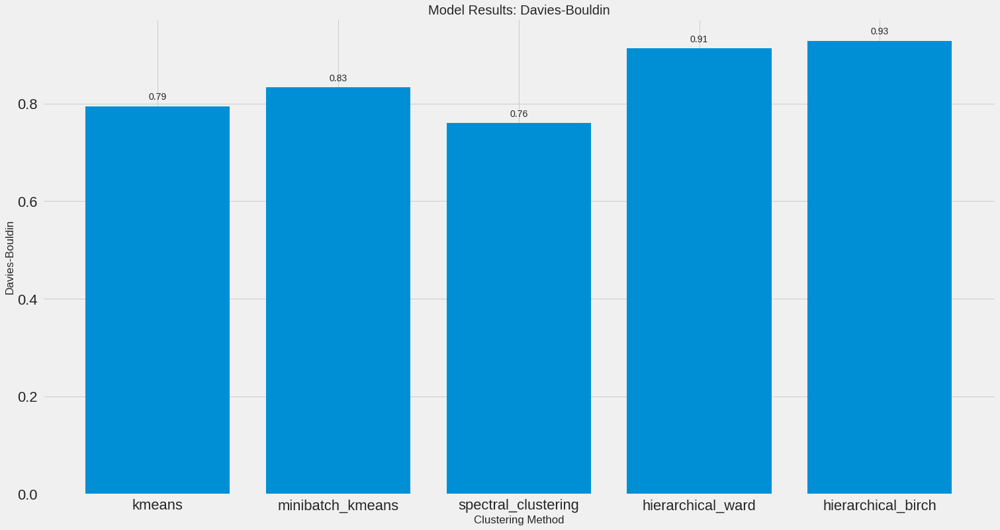

In [42]:
plot_model_results(davies_bouldin, "Davies-Bouldin")

# Evaluate the Final Chosen Model

In [127]:
# Choose the model that produces the best internal validity measures
chosen_model = cluster_results["kmeans"]
labels = chosen_model.labels_

## Visualization of Clusters

#### Visualization of Clusters

##### 2D

In [128]:
# The dataset utilized for clustering may have used more than 2 components
# So, take the original processed matrix "X" and project it onto 2 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_tsne(X_cluster, 2, labels)

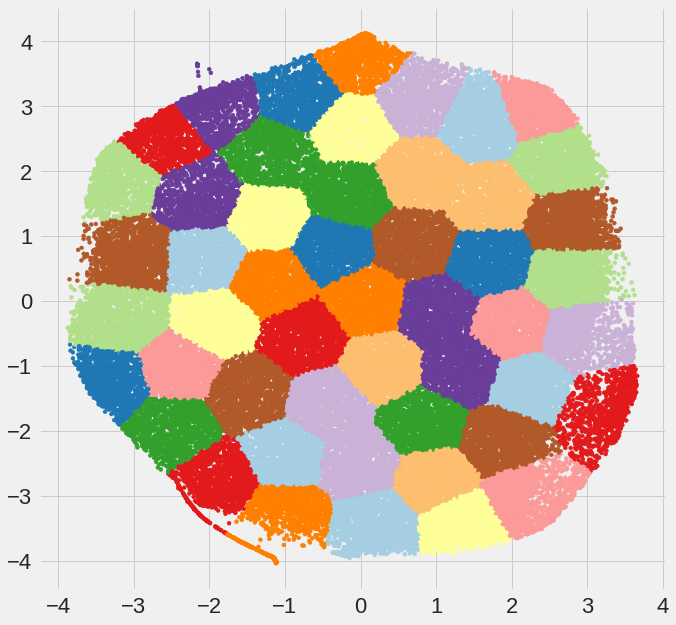

In [129]:
plot_2d(df_clust_viz, chosen_model, False)

##### 3D

In [130]:
# The dataset utilized for clustering may have more than 3 components
# So, take the original processed matrix "X" and project it onto 3 dimensions
# Then, attach the cluster labels to the final outputted dataframe

df_clust_viz = prepare_pca(X, 3, labels)

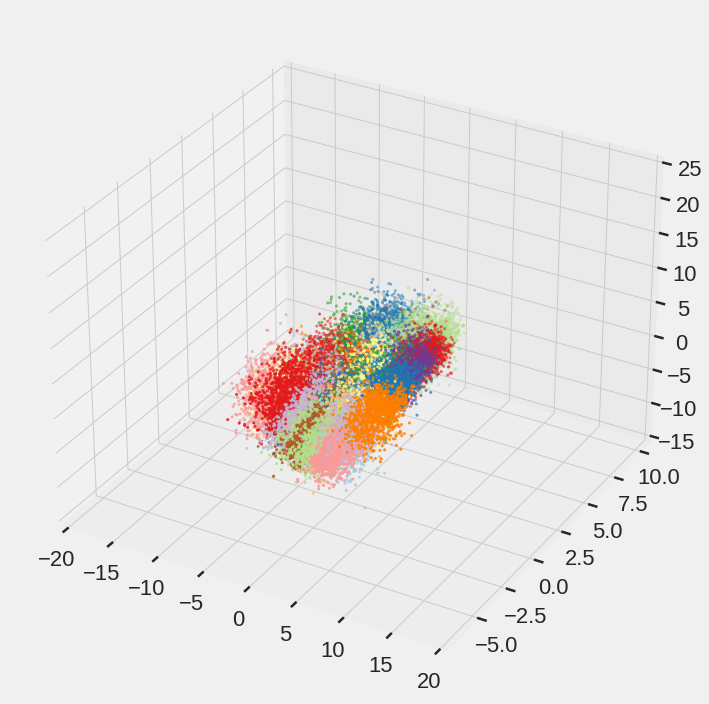

In [131]:
plot_3d(df_clust_viz)

## Interpreting Clusters

Sources

https://towardsdatascience.com/cluster-analysis-create-visualize-and-interpret-customer-segments-474e55d00ebb

https://github.com/MaartenGr/CustomerSegmentation/blob/master/Customer%20Segmentation.ipynb

Now that the clusters have been created, it would be nice to determine what makes each one unique. This will help with understanding the differences between the various neighborhood groupings.

### Variance Within Variables and Between Clusters

Group datapoints by cluster and take the average. Then, calculate the standard deviation between those values for each variable. Variables with a higher standard deviation indicate that there are large differences between clusters and the variable might be important.

In [ ]:
#chosen_model = pickle.load( open( "kmeans_results.obj", "rb" ) )
#labels = chosen_model.labels_

In [12]:
# Go back the original dataframe with the raw data that has all the features (i.e., df_viz)
df_temp = df_viz[df_viz.columns[~df_viz.columns.isin(["GEOID","GEO_ID","NAME"])]].copy()

# Filter out the rows that weren't used for clustering
#temp = list(set(list(df["GEOID"])).difference(set(list(df_temp["GEOID"]))))

In [13]:
# Setting all variables between 0 and 1 in order to better visualize the results
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_temp))
df_scaled.columns = df_temp.columns

In [14]:
# Save the labels of the chosen model
df_temp["labels"] = chosen_model.labels_
df_scaled["labels"] = chosen_model.labels_

In [15]:
# Calculate variables with largest differences (by standard deviation)
# The higher the standard deviation in a variable based on average values for each cluster
# The more likely that the variable is important when creating the cluster
df_mean = df_scaled.loc[df_scaled.labels!=-1, :].groupby('labels').mean().reset_index()

results = pd.DataFrame(columns=['Variable', 'Std'])

for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.std(df_mean[column])]

In [16]:
# Choose the number of columns to evaluate
num_cols = 10

# Put the contents of the top columns in a list
selected_columns = list(results.sort_values('Std', ascending=False)
                        .head(num_cols).Variable.values) + ["labels"]

In [17]:
results[results['Variable'].isin(selected_columns)]

,Variable,Std
8,HH_TOT_1_Unit_Stuct,0.161903
9,HH_TOT_2_Plus_Unit_Struct,0.184656
10,HH_TOT_Owner,0.171818
11,RACE_One_Race_White,0.200021
19,EDU_25_PLUS_w_Bachelors_Plus,0.165104
25,WT_N_GROCERY_DIST_25,0.192031
26,WT_N_GYMS_DIST_25,0.196951
27,WT_N_HARDWARE_DIST_25,0.190964
28,WT_N_PARKS_DIST_25,0.202806
29,WT_N_MEDICAL_DIST_25,0.189291


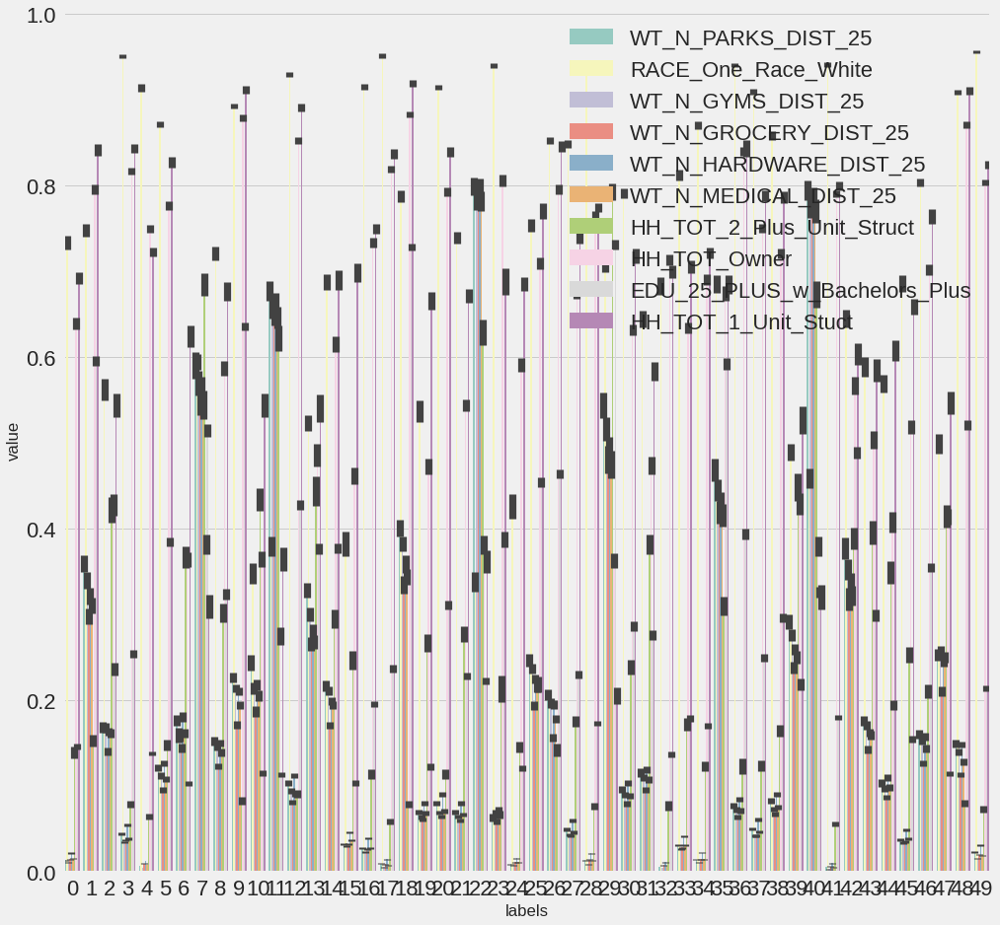

In [137]:
# Plot data
tidy = df_scaled[selected_columns].melt(id_vars='labels')
fig, ax = plt.subplots(figsize=(15, 15))
plt.style.use("fivethirtyeight")
sns.barplot(x='labels', y='value', hue='variable', data=tidy, palette='Set3')
plt.legend(loc='upper right')

#### Heatmap of Important Features

Sources

https://www.bigendiandata.com/2017-04-18-Jupyter_Customer360/

In [138]:
# Filter the scaled dataframe for the labels and important featues
df_scaled_sub = df_scaled[selected_columns]

In [139]:
# Split the dataframe into cluster groups.
# Then, compute the mean for all columns in every group
df_grouped = df_scaled_sub.groupby(["labels"], sort=True).mean()

In [140]:
# Put the column labels in a list
labels = list(df_scaled_sub.labels.unique())
labels.sort()

In [141]:
data = [go.Heatmap(z=df_grouped.values.tolist(), 
                   y=labels,
                   x=list(df_grouped.columns),
                   colorscale='Viridis')]

plotly.offline.iplot(data, filename='pandas-heatmap')

#### Density Plots of Important Features

Sources

https://radiant-rstats.github.io/docs/multivariate/kclus.html

https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.density.html

Density Plot for Feature: WT_N_PARKS_DIST_25
Density Plot for Feature: RACE_One_Race_White
Density Plot for Feature: WT_N_GYMS_DIST_25
Density Plot for Feature: WT_N_GROCERY_DIST_25
Density Plot for Feature: WT_N_HARDWARE_DIST_25
Density Plot for Feature: WT_N_MEDICAL_DIST_25
Density Plot for Feature: HH_TOT_2_Plus_Unit_Struct
Density Plot for Feature: HH_TOT_Owner
Density Plot for Feature: EDU_25_PLUS_w_Bachelors_Plus
Density Plot for Feature: HH_TOT_1_Unit_Stuct


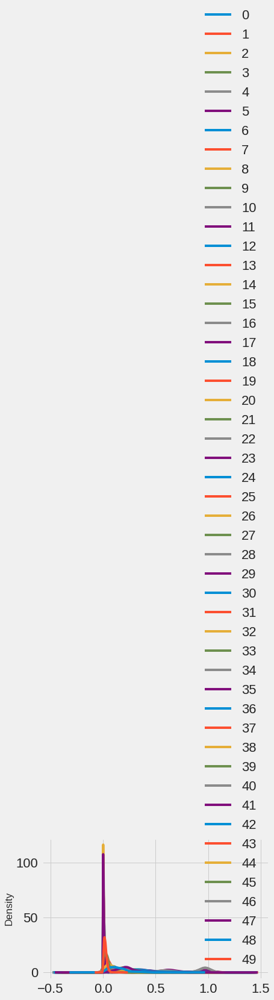

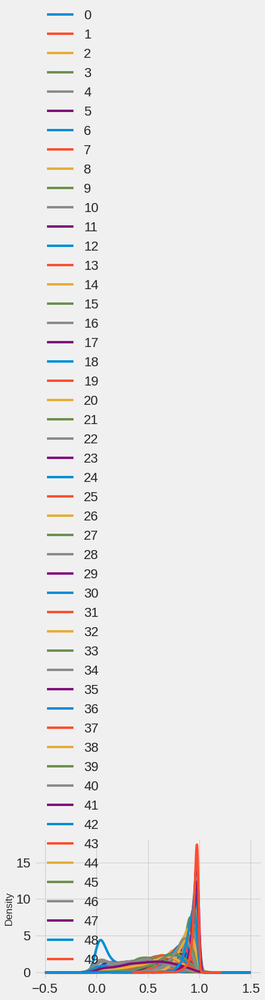

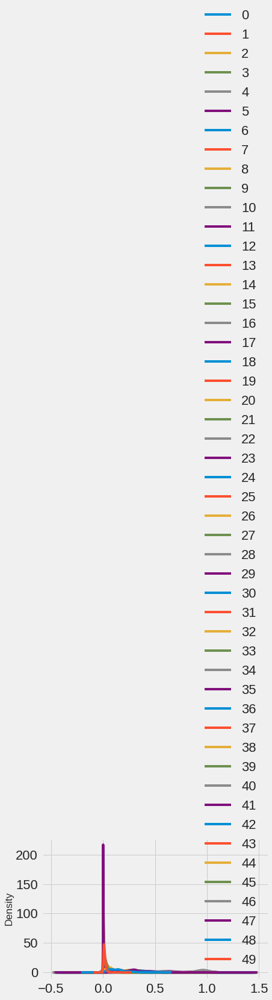

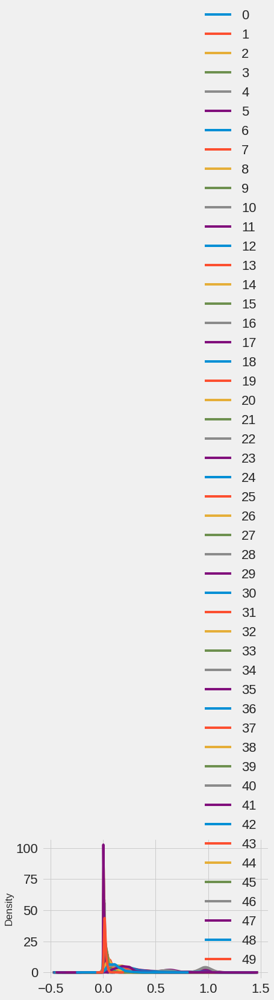

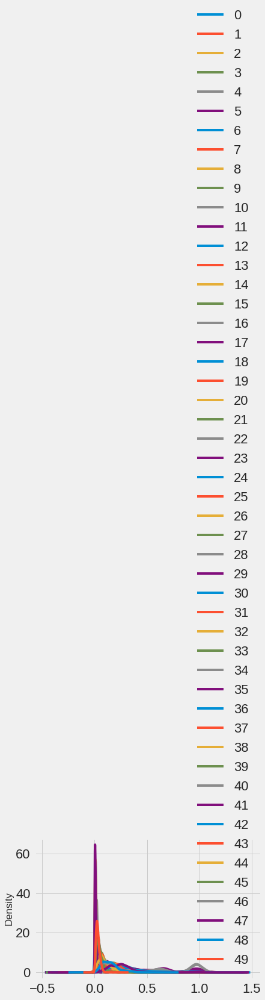

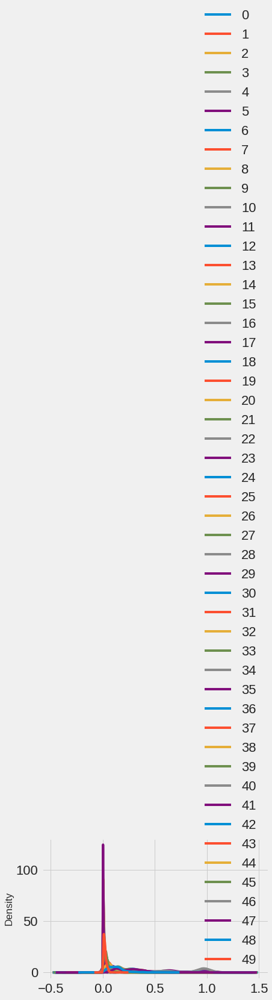

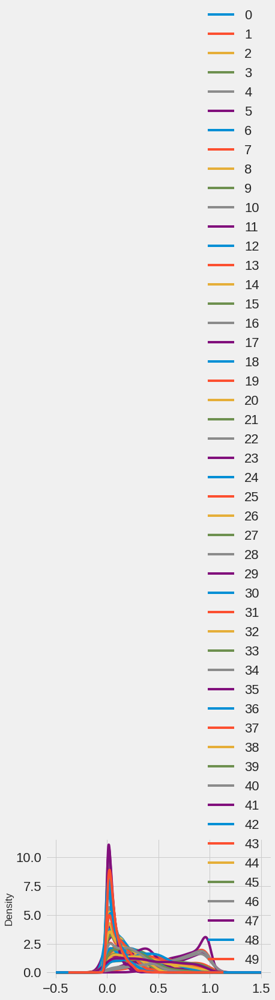

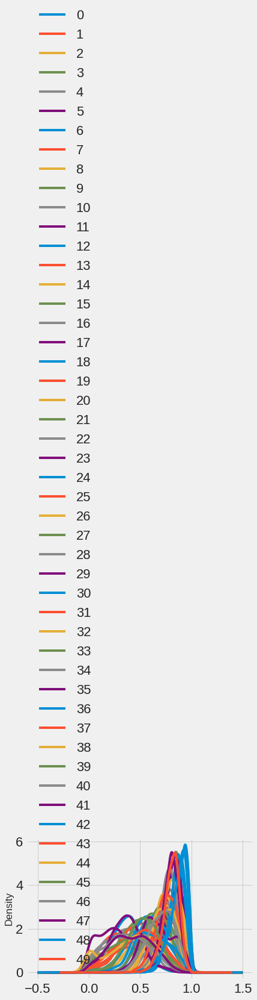

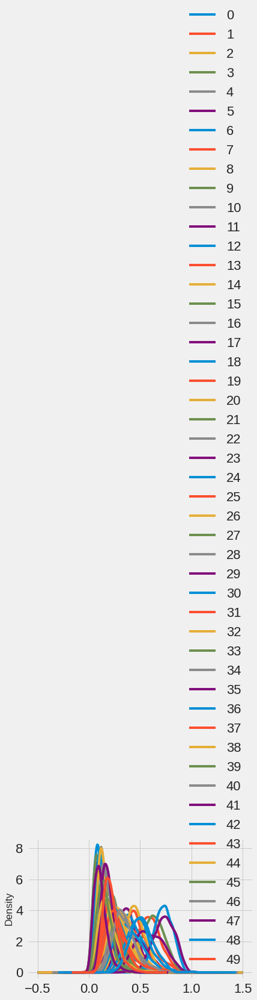

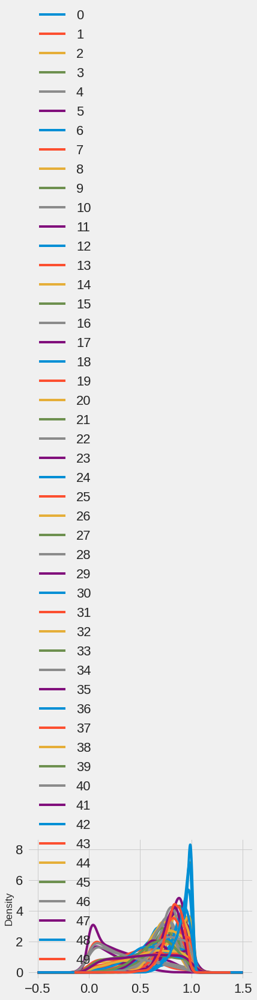

In [142]:
for i in range(len(selected_columns[:-1])):

    df_density = pd.DataFrame(df_scaled_sub[df_scaled_sub["labels"]==0].iloc[:,i])
    col = list(df_density.columns)[0]
    df_density.rename(columns={col:"0"}, inplace=True)

    for l in labels[1:]:
        new_col = df_scaled_sub[df_scaled_sub["labels"]==l].iloc[:,i]
        df_density = pd.concat([df_density, new_col], axis=1, sort=False)
        df_density.rename(columns={col:str(l)}, inplace=True)
    
    print("Density Plot for Feature: " + selected_columns[i])
    df_density.plot.kde()

## Create Cluster Output

Get the GEOIDs. Attach the cluster labels to this data. Attach the X_cluster data (which can be used for proximity-based ranking)

In [143]:
out_df = df_viz[['GEOID']].copy()
out_df.columns = [x.strip() for x in out_df.columns]
out_df = out_df[['GEOID']]
out_df['cluster'] = chosen_model.labels_
# the components can be used as location data for each of the cluster points.
# attach this to the output df.
components = pd.DataFrame(X_cluster)
components.columns = ['x', 'y']
out_df = pd.concat([out_df, components], axis=1)

print(out_df.shape, len(chosen_model.labels_))
out_df.head()

(73056, 4) 73056


,GEOID,cluster,x,y
0,10003000400,2,-1.860907,0.615662
1,10003001300,9,2.577122,2.130342
2,10003002600,10,-2.561575,0.043658
3,10003010200,30,0.192668,0.138120
4,10003010300,8,-0.239025,0.796347


For each member (within each cluster), find the three closest points (ordered by closest to farthest) in the feature space.

In [144]:
import scipy.spatial as spatial

In [145]:
for cluster_ in sorted(out_df.cluster.unique()):
    print('Processing cluster #{}'.format(cluster_))
    sub_df = out_df[out_df.cluster==cluster_].reset_index(drop=True)
    points = sub_df[['x', 'y']].values
    point_tree = spatial.cKDTree(points)
    
    for idx, row in sub_df.iterrows():
        # get 4 results back. Exclude the first (index=0) since that
        # will be the input point. results are ordered by distance already.
        matches = point_tree.query([row.x, row.y], k=4)
        indicies = matches[1]
        # Get the GEOID match for each index from the sub df (to avoid pandas
        # index issues)
        rank1geoid = sub_df.iloc[indicies[1]].GEOID
        rank2geoid = sub_df.iloc[indicies[2]].GEOID
        rank3geoid = sub_df.iloc[indicies[3]].GEOID
        # Store the results by GEOID
        out_df.loc[out_df.GEOID==row.GEOID, 'top1'] = int(rank1geoid)
        out_df.loc[out_df.GEOID==row.GEOID, 'top2'] = int(rank2geoid)
        out_df.loc[out_df.GEOID==row.GEOID, 'top3'] = int(rank3geoid)

out_df.head()

Processing cluster #0
Processing cluster #1
Processing cluster #2
Processing cluster #3
Processing cluster #4
Processing cluster #5
Processing cluster #6
Processing cluster #7
Processing cluster #8
Processing cluster #9
Processing cluster #10
Processing cluster #11
Processing cluster #12
Processing cluster #13
Processing cluster #14
Processing cluster #15
Processing cluster #16
Processing cluster #17
Processing cluster #18
Processing cluster #19
Processing cluster #20
Processing cluster #21
Processing cluster #22
Processing cluster #23
Processing cluster #24
Processing cluster #25
Processing cluster #26
Processing cluster #27
Processing cluster #28
Processing cluster #29
Processing cluster #30
Processing cluster #31
Processing cluster #32
Processing cluster #33
Processing cluster #34
Processing cluster #35
Processing cluster #36
Processing cluster #37
Processing cluster #38
Processing cluster #39
Processing cluster #40
Processing cluster #41
Processing cluster #42
Processing cluster #4

,GEOID,cluster,x,y,top1,top2,top3
0,10003000400,2,-1.860907,0.615662,2.451027e+10,4.847368e+10,4.703701e+10
1,10003001300,9,2.577122,2.130342,1.703172e+10,1.805711e+10,4.903511e+10
2,10003002600,10,-2.561575,0.043658,9.003417e+09,3.602900e+10,6.053002e+09
3,10003010200,30,0.192668,0.138120,6.097151e+09,4.212575e+10,2.812102e+10
4,10003010300,8,-0.239025,0.796347,3.301100e+10,4.904900e+10,3.702100e+10


In [146]:
# can drop x, y; no longer needed.
out_df.drop(columns=['x', 'y'], inplace=True)
out_df.head()

,GEOID,cluster,top1,top2,top3
0,10003000400,2,2.451027e+10,4.847368e+10,4.703701e+10
1,10003001300,9,1.703172e+10,1.805711e+10,4.903511e+10
2,10003002600,10,9.003417e+09,3.602900e+10,6.053002e+09
3,10003010200,30,6.097151e+09,4.212575e+10,2.812102e+10
4,10003010300,8,3.301100e+10,4.904900e+10,3.702100e+10


In [147]:
out_df.to_pickle('../data/cluster_model_output/clusters_and_ranks.pkl')